<a href="https://colab.research.google.com/github/LaouaMERiLO/Ensemble-UNet-Enhancing-Brain-Tumor-Segmentation/blob/main/Ensemble_learning_Brain_Tumor_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Activation, BatchNormalization, Dropout, Lambda, Conv2D, Conv2DTranspose,  MaxPool2D, Concatenate
from tensorflow.keras import Input
from tensorflow.keras.models import Model, load_model, save_model
from tensorflow.keras.optimizers import Adam


# Data Visualization

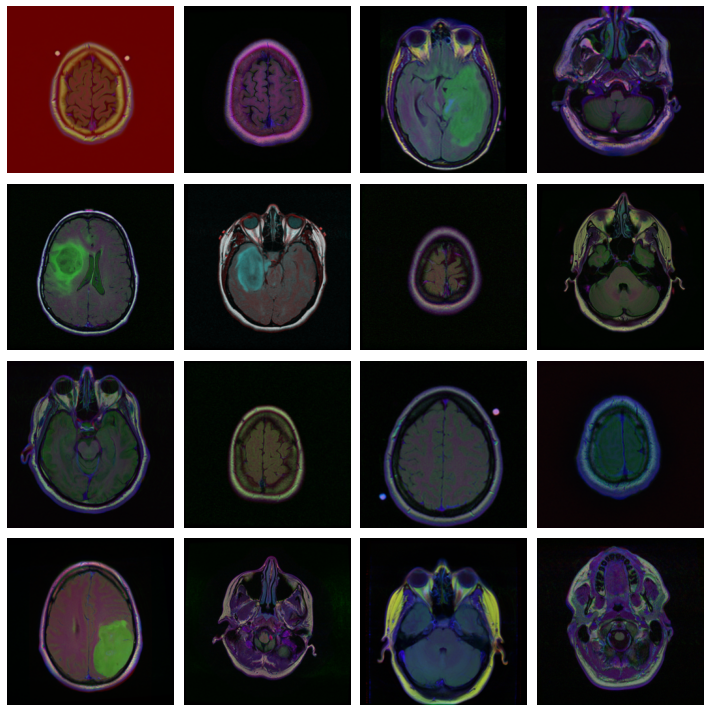

In [ ]:
import cv2
import matplotlib.pyplot as plt
from glob import glob
import random
masks_paths= glob(r'D:\archive_3\kaggle_3m\*\*_mask*')
images_paths=[path.replace("_mask","") for path in masks_paths]
random.seed(42)
random_images = random.sample(images_paths, 16)

num_rows = 4
num_cols = 4
total_plots = num_rows * num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 10))

for i, image_path in enumerate(random_images):
    row = i // num_cols
    col = i % num_cols

    image = cv2.imread(image_path)

    axes[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    #axes[row, col].set_title('Image')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


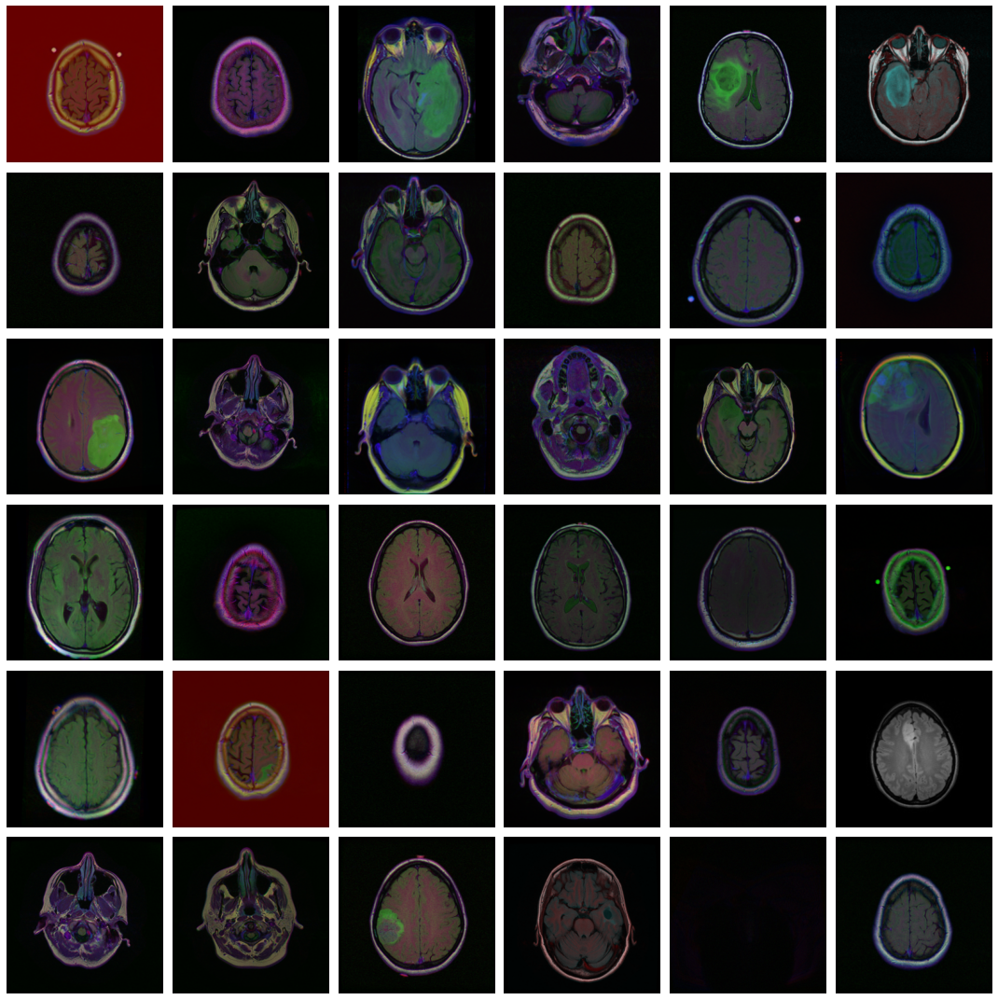

In [ ]:
import cv2
import matplotlib.pyplot as plt
from glob import glob
import random

masks_paths = glob(r'D:\archive_3\kaggle_3m\*\*_mask*')
images_paths = [path.replace("_mask", "") for path in masks_paths]

num_rows = 6
num_cols = 6
total_plots = num_rows * num_cols

random.seed(42)
random_images = random.sample(images_paths, total_plots)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

for i, image_path in enumerate(random_images):
    row = i // num_cols
    col = i % num_cols

    image = cv2.imread(image_path)

    axes[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    # axes[row, col].set_title('Image')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


# ***Accuracy Metrics***

In [ ]:
smooth=100

def dice_coef(y_true, y_pred):
    y_truef=K.flatten(y_true)
    y_predf=K.flatten(y_pred)
    And=K.sum(y_truef* y_predf)
    return((2* And + smooth) / (K.sum(y_truef) + K.sum(y_predf) + smooth))

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

def iou(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac

def jac_distance(y_true, y_pred):
    y_truef=K.flatten(y_true)
    y_predf=K.flatten(y_pred)

    return - iou(y_true, y_pred)

# ***Ensemble Accuracy metrics***

In [ ]:
def calculate_iou(mask1, mask2):
    intersection = np.logical_and(mask1, mask2)
    union = np.logical_or(mask1, mask2)
    intersection_area = np.sum(intersection)
    union_area = np.sum(union)

    # Handle division by zero
    if union_area == 0:
        iou = 0
    else:
        iou = intersection_area / union_area

    return iou

In [ ]:
def dice_coefficient(mask1, mask2):
    intersection = np.logical_and(mask1, mask2)
    sum_mask1 = np.sum(mask1)
    sum_mask2 = np.sum(mask2)

    # Handle division by zero
    if sum_mask1 + sum_mask2 == 0:
        dice = 0
    else:
        dice = 2.0 * np.sum(intersection) / (sum_mask1 + sum_mask2)

    return dice



In [ ]:
import numpy as np

def calculate_accuracy(ground_truth, predicted_mask):
    # Count the number of pixels that match between the ground truth and predicted mask
    correct_pixels = np.sum(ground_truth == predicted_mask)

    # Calculate the total number of pixels in the ground truth mask
    total_pixels = np.prod(ground_truth.shape)

    # Calculate the accuracy by dividing the number of correct pixels by the total number of pixels
    accuracy = correct_pixels / total_pixels

    # Return the accuracy
    return accuracy




# ***ENSEMBLE FUSION SCORE LEVEL RESULTS***

In [ ]:
from tensorflow.keras.optimizers import legacy

In [ ]:
BATCH_SIZE = 32
epochs=2
learning_rate=0.0001
decay_rate = learning_rate / epochs

In [ ]:
model_load1 = load_model(r"C:\unet_dense.hdf5", custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})
model_load1.compile(optimizer=legacy.Adam(lr=learning_rate, decay=decay_rate), loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])
model_load2 = load_model(r"C:\unet_Resnet.hdf5", custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})
model_load2.compile(optimizer=legacy.Adam(lr=learning_rate, decay=decay_rate), loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])
model_load3 = load_model(r"C:\DeepLabV3Plus.hdf5", custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})
model_load3.compile(optimizer=legacy.Adam(lr=learning_rate, decay=decay_rate), loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])
model_load4 = load_model(r"C:\mobilenet.hdf5", custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})
model_load4.compile(optimizer=legacy.Adam(lr=learning_rate, decay=decay_rate), loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])

D:\emp\anaconda\lib\site-packages\keras\optimizers\legacy\adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


### Mean score prediction

In [ ]:
import numpy as np
import cv2

# Create a list of models
models = [model_load1, model_load2, model_load3, model_load4]
DICE_COFF = []
IUO = []
ACCURACY = []

for idx in range(len(testdata.index)):


    ground_truth = cv2.imread(testdata['mask'].iloc[idx])
    ground_truth = np.expand_dims(ground_truth[:, :, 0], axis=(0, -1))
    ground_truth = ground_truth / 255

    # Calculate accuracy, iou, and dice coefficient
    accuracy = calculate_accuracy(ground_truth, prediction)
    iou = calculate_iou(ground_truth, prediction)
    dice_coff = dice_coefficient(ground_truth, prediction)

    ACCURACY.append(accuracy)
    IUO.append(iou)
    DICE_COFF.append(dice_coff)






# Print the results
print("Prediction accuracy:", np.mean(ACCURACY))
print("Prediction IUO:", np.mean(filtered_iuo))
print("Prediction DICE_COFF:", np.mean(filtered_dice_coff))


1/1 [==============================] - 0s 452ms/step


1/1 [==============================] - 0s 458ms/step


1/1 [==============================] - 1s 907ms/step


1/1 [==============================] - 0s 456ms/step


1/1 [==============================] - 1s 1s/step


1/1 [==============================] - 1s 903ms/step
Prediction accuracy: 0.9990589636882753
Prediction IUO: 0.8692826072598916
Prediction DICE_COFF: 0.9140941673959402


### Min score prediction

In [ ]:
import numpy as np
import cv2

# Create a list of models
models = [model_load1, model_load2, model_load3, model_load4]
DICE_COFF = []
IUO = []
ACCURACY = []

for loop in range(len(testdata.index)):


    ground_truth = cv2.imread(testdata['mask'].iloc[idx])
    ground_truth = np.expand_dims(ground_truth[:, :, 0], axis=(0, -1))
    ground_truth = ground_truth / 255

    # Calculate accuracy, iou, and dice coefficient
    accuracy = calculate_accuracy(ground_truth, prediction)
    iou = calculate_iou(ground_truth, prediction)
    dice_coff = dice_coefficient(ground_truth, prediction)

    ACCURACY.append(accuracy)
    IUO.append(iou)
    DICE_COFF.append(dice_coff)

# Print the results
print("Prediction accuracy:", np.mean(ACCURACY))
print("Prediction IUO:", np.mean(filtered_iuo))
print("Prediction DICE_COFF:", np.mean(filtered_dice_coff))


1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 2s 2s/step
Prediction accuracy: 0.9988537659778547
Prediction IUO: 0.8359591674630974
Prediction DICE_COFF: 0.8897023709170673


In [ ]:
print("Prediction accuracy:", np.mean(ACCURACY))
print("Prediction IUO:", np.mean(filtered_iuo))
print("Prediction DICE_COFF:", np.mean(filtered_dice_coff))


Prediction accuracy: 0.9988537659778547
Prediction IUO: 0.8359591674630974
Prediction DICE_COFF: 0.8897023709170673


### max score prediction

In [ ]:
import numpy as np
import cv2

# Create a list of models
models = [model_load1, model_load2, model_load3, model_load4]
DICE_COFF = []
IUO = []
ACCURACY = []

for loop in range(len(testdata.index)):


    ground_truth = cv2.imread(testdata['mask'].iloc[idx])
    ground_truth = np.expand_dims(ground_truth[:, :, 0], axis=(0, -1))
    ground_truth = ground_truth / 255

    # Calculate accuracy, iou, and dice coefficient
    accuracy = calculate_accuracy(ground_truth,prediction)
    iou = calculate_iou(ground_truth, prediction)
    dice_coff = dice_coefficient(ground_truth, prediction)

    ACCURACY.append(accuracy)
    IUO.append(iou)
    DICE_COFF.append(dice_coff)


# Print the results
print("Prediction accuracy:", np.mean(ACCURACY))
print("Prediction IUO:", np.mean(filtered_iuo))
print("Prediction DICE_COFF:", np.mean(filtered_dice_coff))


1/1 [==============================] - 3s 3s/step


1/1 [==============================] - 1s 1s/step


1/1 [==============================] - 3s 3s/step


1/1 [==============================] - 1s 1s/step


1/1 [==============================] - 3s 3s/step
Prediction accuracy: 0.9990178853197559
Prediction IUO: 0.8667654760725773
Prediction DICE_COFF: 0.920270080489117


In [ ]:
print("Prediction accuracy:", np.mean(ACCURACY))
print("Prediction IUO:", np.mean(filtered_iuo))
print("Prediction DICE_COFF:", np.mean(filtered_dice_coff))

Prediction accuracy: 0.9990178853197559
Prediction IUO: 0.8667654760725773
Prediction DICE_COFF: 0.920270080489117


# ***ENSEMBLE FUSION DECISION LEVEL RESULTS***

In [ ]:
import numpy as np
import cv2
from scipy.stats import mode

# Create a list of models
models = [model_load1, model_load2, model_load3, model_load4]
DICE_COFF = []
IUO = []
ACCURACY = []

for idx in range(len(testdata.index)):

    ground_truth = cv2.imread(testdata['mask'].iloc[idx])
    ground_truth = np.expand_dims(ground_truth[:, :, 0], axis=(0, -1))
    ground_truth = ground_truth / 255

    # Calculate accuracy, iou, and dice coefficient
    accuracy = calculate_accuracy(ground_truth,decision_prediction)
    iou = calculate_iou(ground_truth, decision_prediction)
    dice_coff = dice_coefficient(ground_truth, decision_prediction)

    ACCURACY.append(accuracy)
    IUO.append(iou)
    DICE_COFF.append(dice_coff)


# Print the results
print("Prediction accuracy:", np.mean(ACCURACY))
print("Prediction IUO:", np.mean(filtered_iuo))
print("Prediction DICE_COFF:", np.mean(filtered_dice_coff))



1/1 [==============================] - 3s 3s/step


1/1 [==============================] - 3s 3s/step


1/1 [==============================] - 6s 6s/step


1/1 [==============================] - 3s 3s/step


1/1 [==============================] - 3s 3s/step
Prediction accuracy: 0.998919809744255
Prediction IUO: 0.8633131737317605
Prediction DICE_COFF: 0.9116818618545649


In [ ]:
print("Prediction accuracy:", np.mean(ACCURACY))
print("Prediction IUO:", np.mean(filtered_iuo))
print("Prediction DICE_COFF:", np.mean(filtered_dice_coff))

Prediction accuracy: 0.998919809744255
Prediction IUO: 0.8633131737317605
Prediction DICE_COFF: 0.9116818618545649


## plot Ensemble prediction

1/1 [==============================] - 2s 2s/step


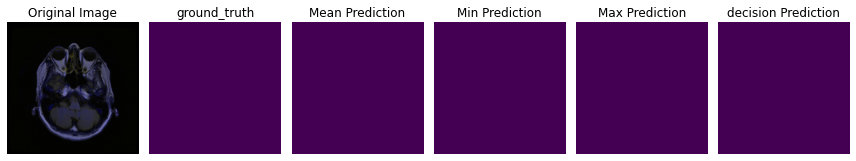

1/1 [==============================] - 1s 811ms/step


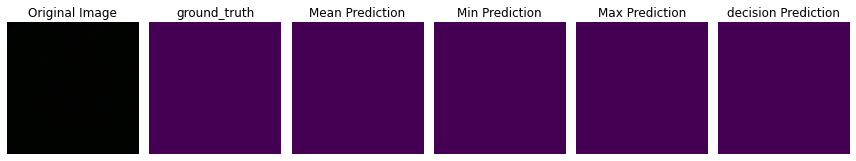

1/1 [==============================] - 1s 817ms/step


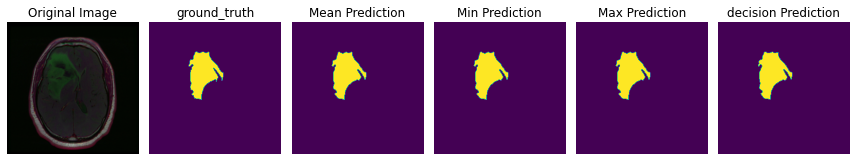

1/1 [==============================] - 1s 846ms/step


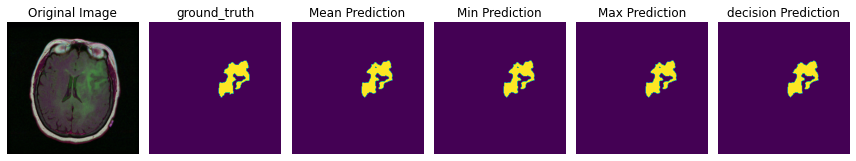

1/1 [==============================] - 1s 1s/step


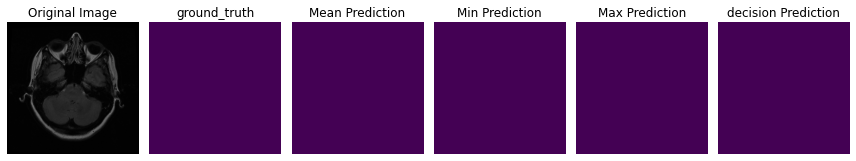

1/1 [==============================] - 1s 1s/step


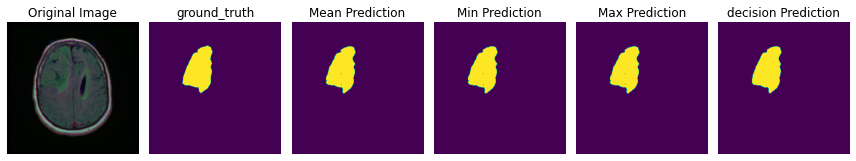

1/1 [==============================] - 1s 724ms/step


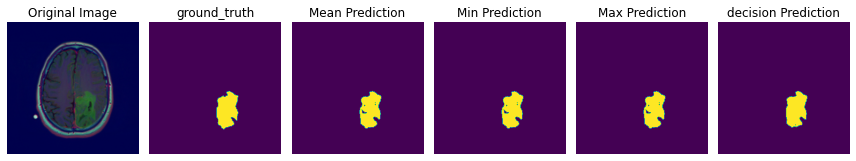

1/1 [==============================] - 1s 882ms/step


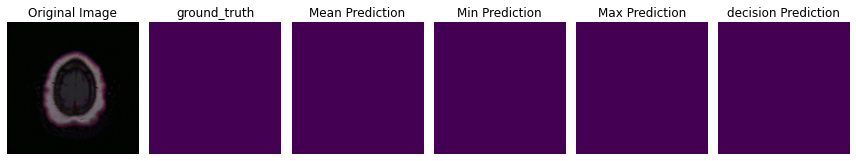

1/1 [==============================] - 1s 969ms/step


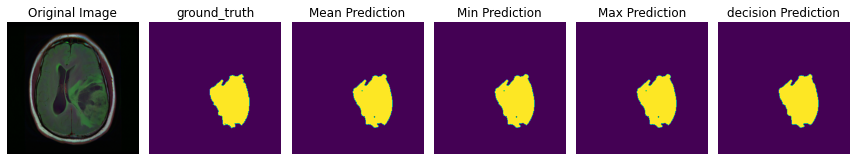

1/1 [==============================] - 1s 785ms/step


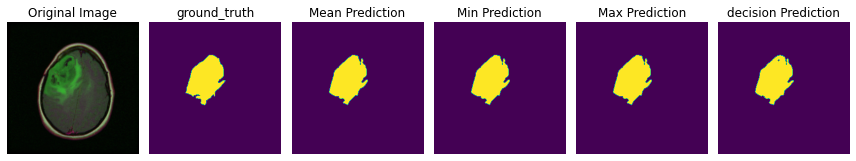

1/1 [==============================] - 1s 761ms/step


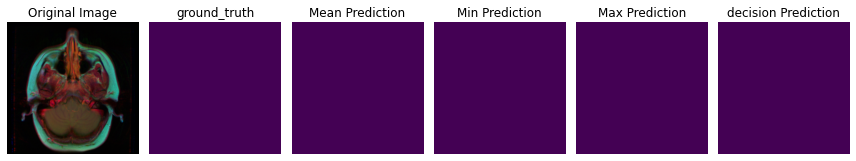

1/1 [==============================] - 1s 1s/step


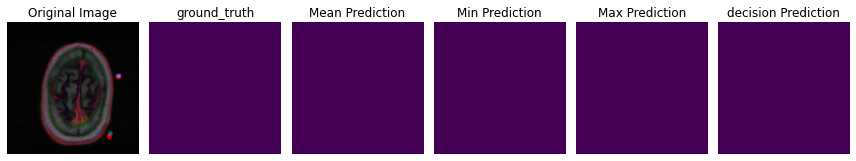

1/1 [==============================] - 1s 865ms/step


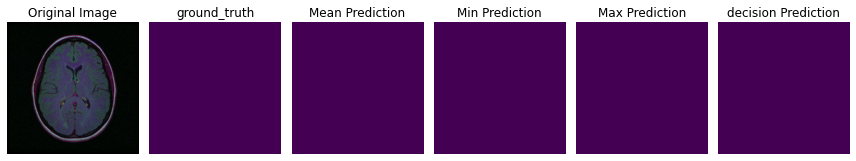

1/1 [==============================] - 1s 871ms/step


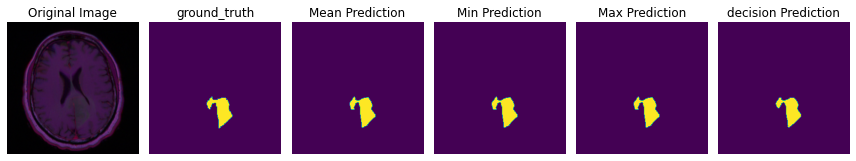

1/1 [==============================] - 1s 778ms/step


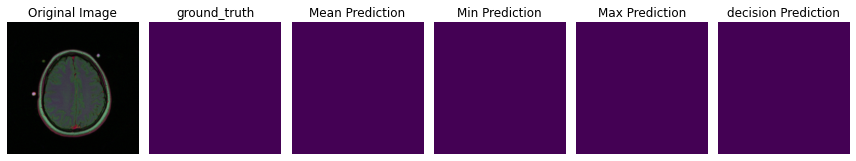

1/1 [==============================] - 1s 831ms/step


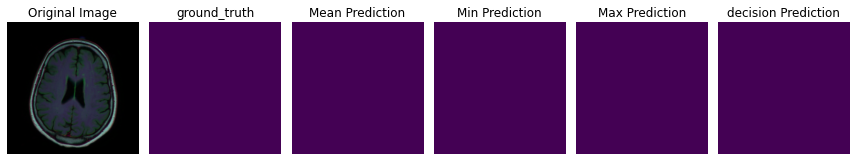

1/1 [==============================] - 1s 761ms/step


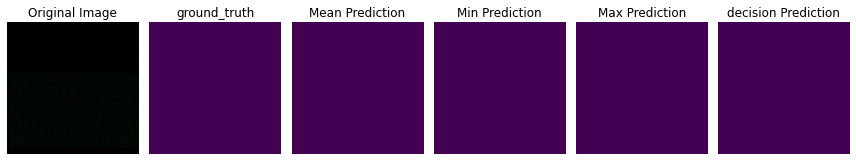

1/1 [==============================] - 1s 875ms/step


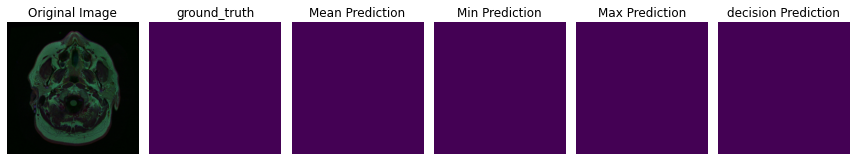

1/1 [==============================] - 1s 743ms/step


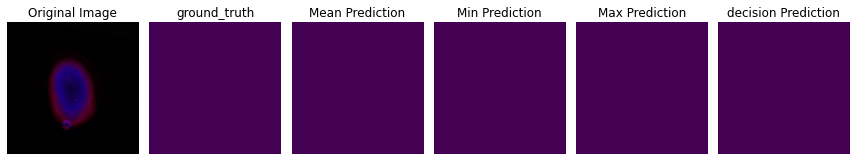

1/1 [==============================] - 1s 810ms/step


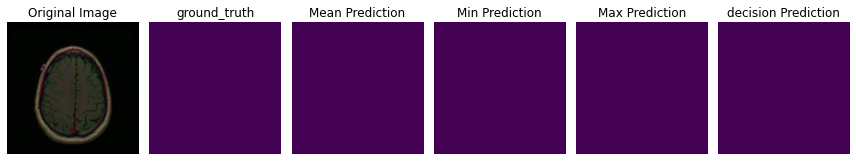

1/1 [==============================] - 1s 851ms/step


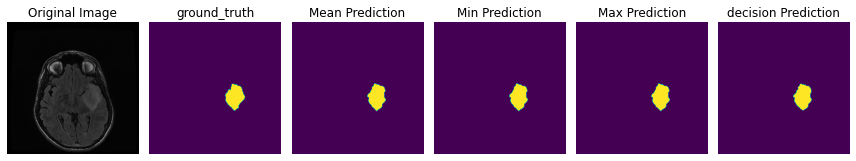

1/1 [==============================] - 1s 797ms/step


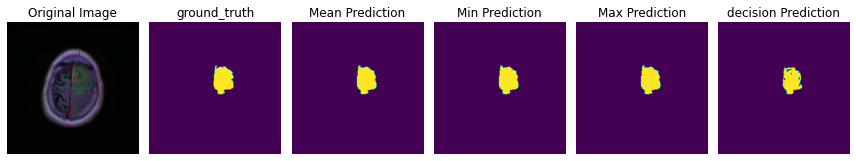

1/1 [==============================] - 1s 926ms/step


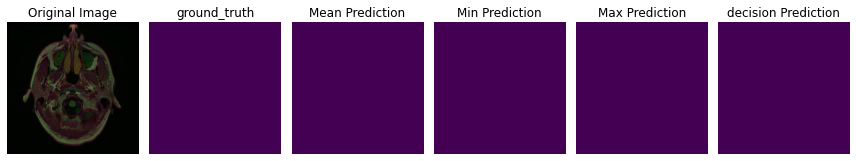

1/1 [==============================] - 1s 837ms/step


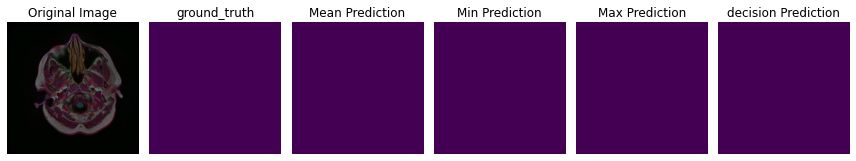

1/1 [==============================] - 1s 759ms/step


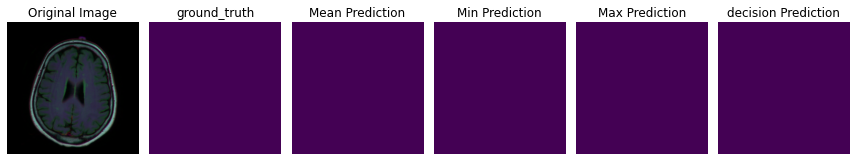

1/1 [==============================] - 1s 909ms/step


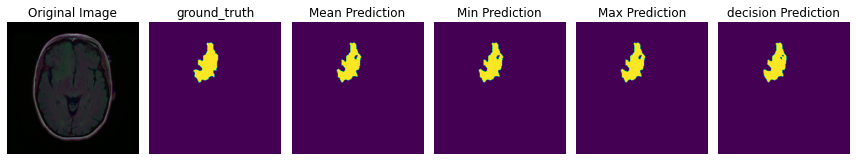

1/1 [==============================] - 1s 748ms/step


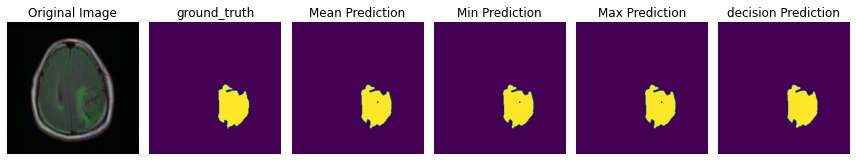

1/1 [==============================] - 1s 721ms/step


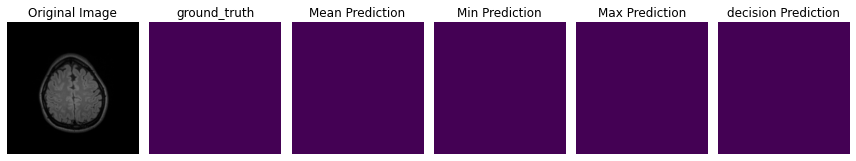

1/1 [==============================] - 1s 734ms/step


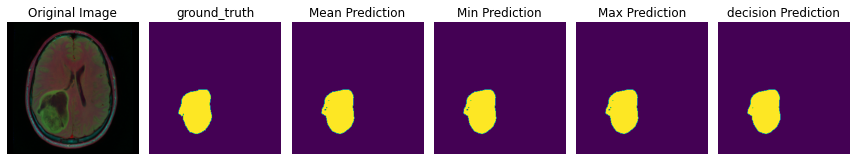

1/1 [==============================] - 1s 734ms/step


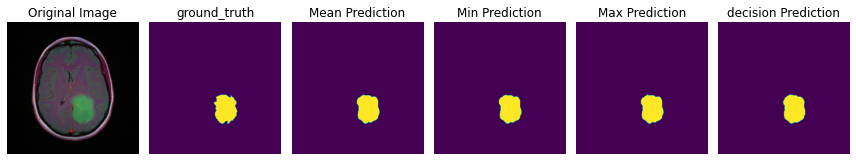

1/1 [==============================] - 1s 756ms/step


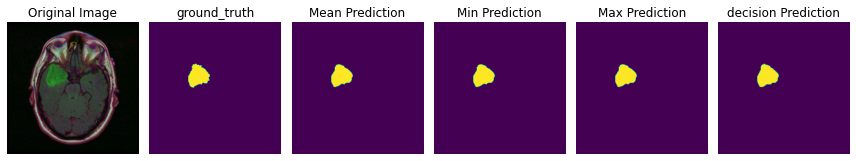

1/1 [==============================] - 1s 723ms/step


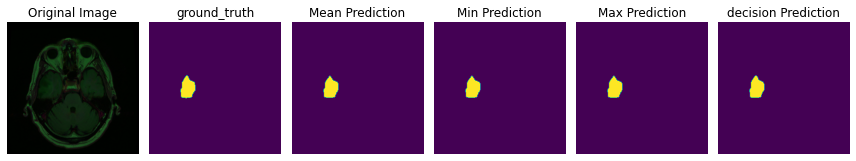

1/1 [==============================] - 1s 720ms/step


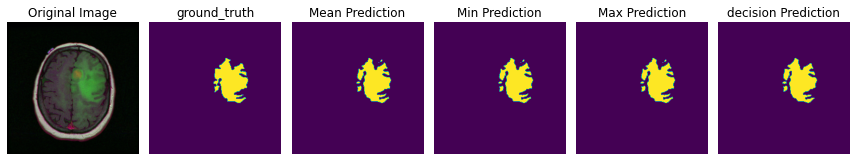

1/1 [==============================] - 1s 772ms/step


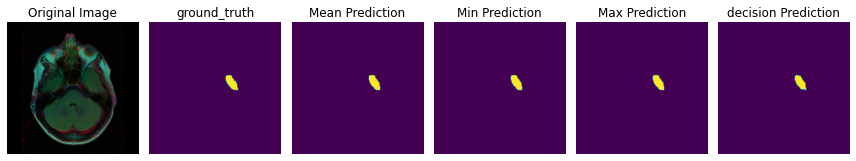

1/1 [==============================] - 1s 769ms/step


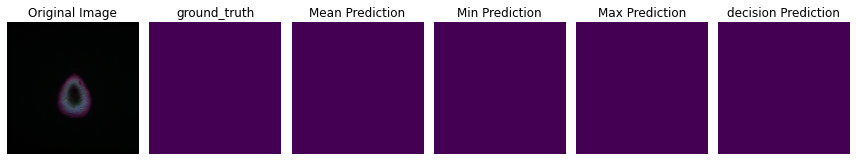

1/1 [==============================] - 1s 755ms/step


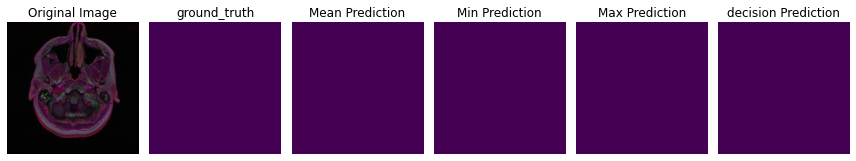

1/1 [==============================] - 1s 799ms/step


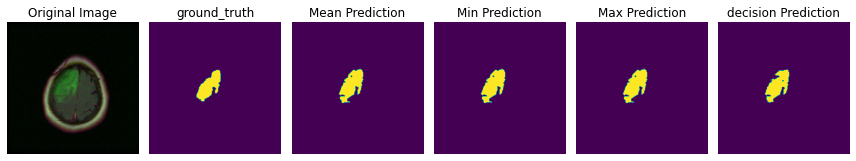

1/1 [==============================] - 1s 746ms/step


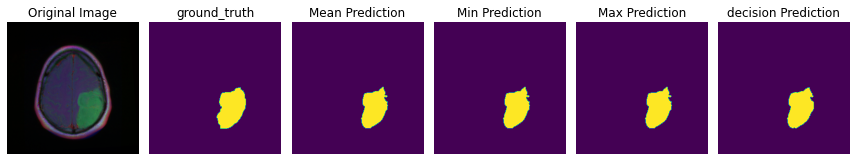

1/1 [==============================] - 1s 841ms/step


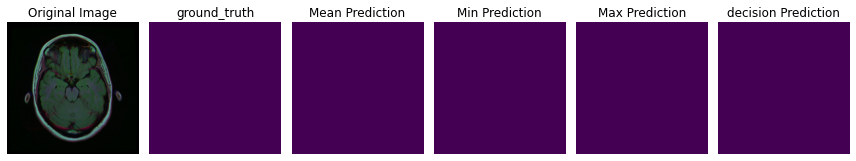

1/1 [==============================] - 1s 745ms/step


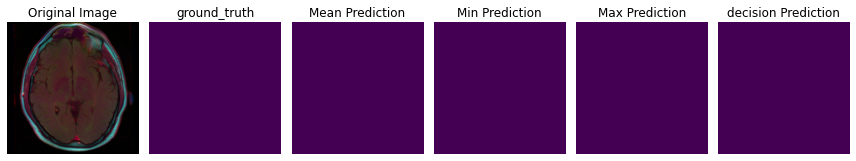

1/1 [==============================] - 1s 735ms/step


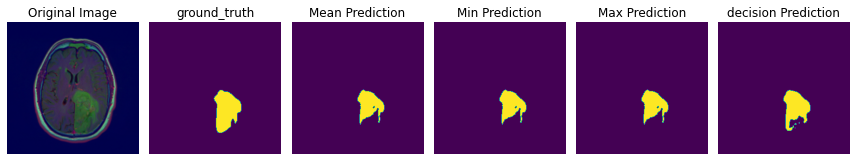

1/1 [==============================] - 1s 741ms/step


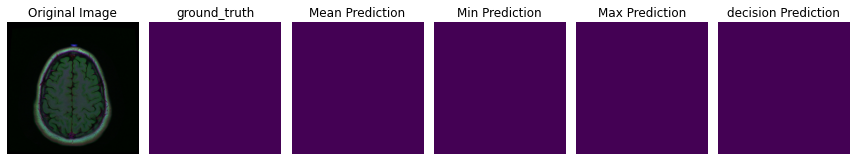

1/1 [==============================] - 1s 755ms/step


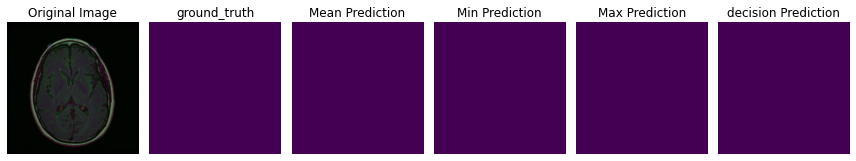

1/1 [==============================] - 1s 745ms/step


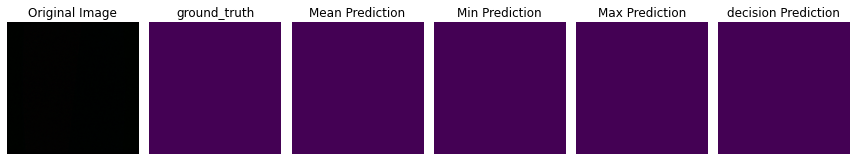

1/1 [==============================] - 1s 721ms/step


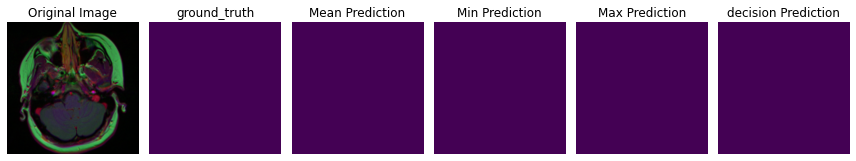

1/1 [==============================] - 1s 735ms/step


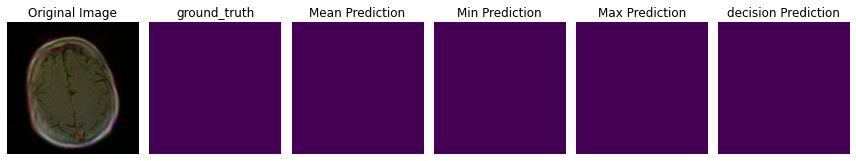

1/1 [==============================] - 1s 729ms/step


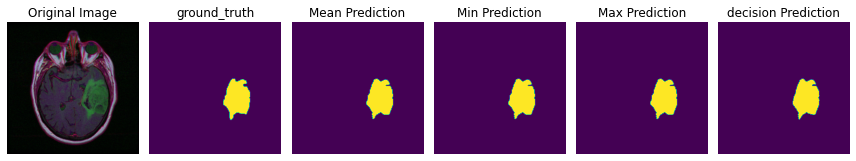

1/1 [==============================] - 1s 739ms/step


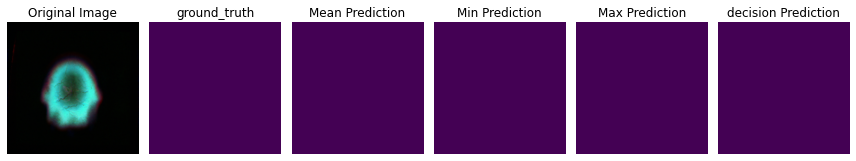

1/1 [==============================] - 1s 826ms/step


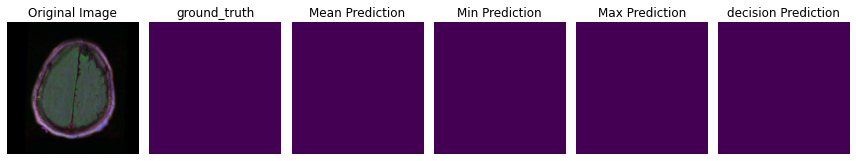

1/1 [==============================] - 1s 779ms/step


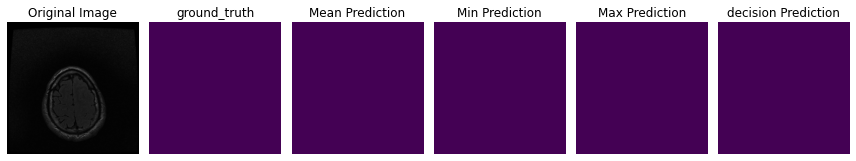

1/1 [==============================] - 1s 741ms/step


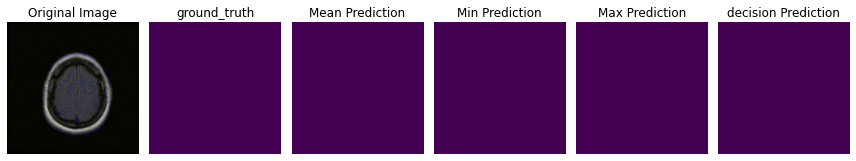

1/1 [==============================] - 1s 741ms/step


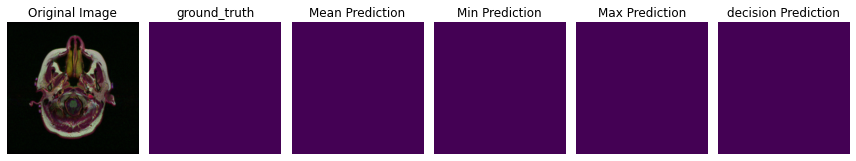

1/1 [==============================] - 1s 738ms/step


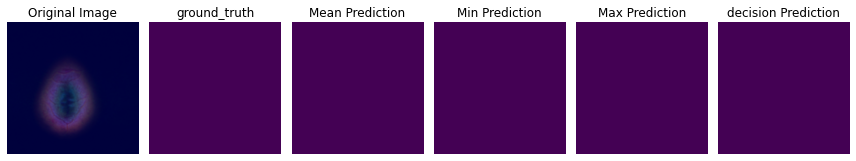

1/1 [==============================] - 1s 741ms/step


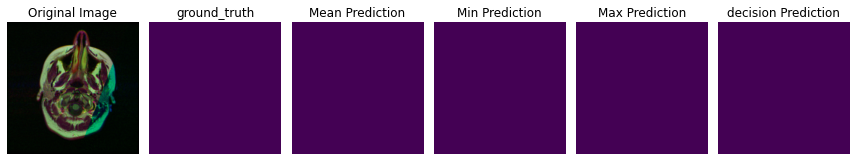

1/1 [==============================] - 1s 786ms/step


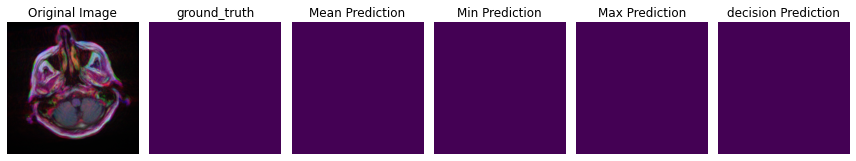

1/1 [==============================] - 1s 730ms/step


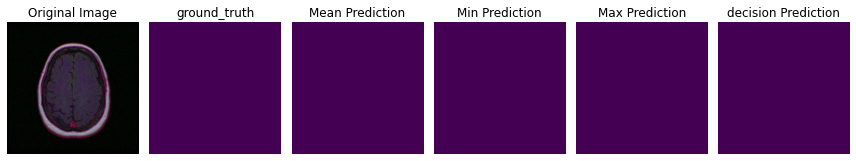

1/1 [==============================] - 1s 751ms/step


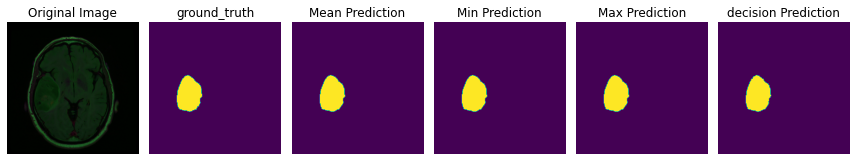

1/1 [==============================] - 1s 803ms/step


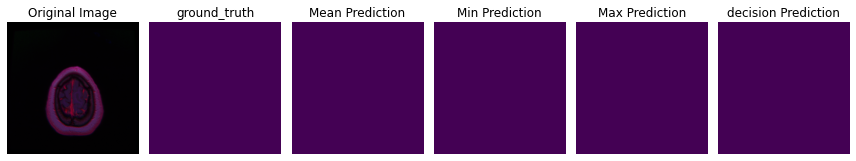

1/1 [==============================] - 1s 733ms/step


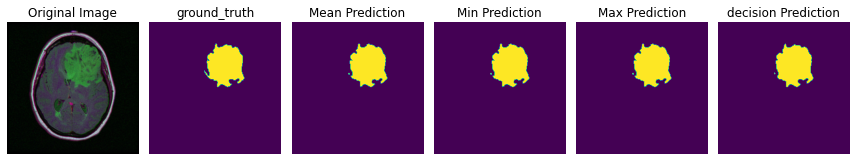

1/1 [==============================] - 1s 807ms/step


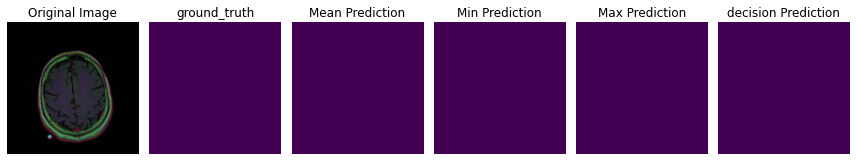

1/1 [==============================] - 1s 722ms/step


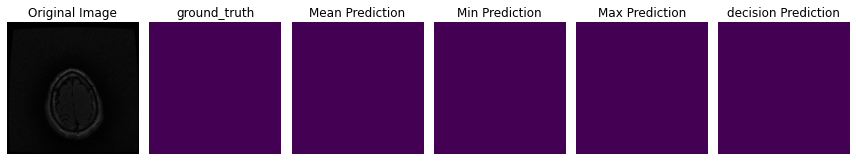

1/1 [==============================] - 1s 909ms/step


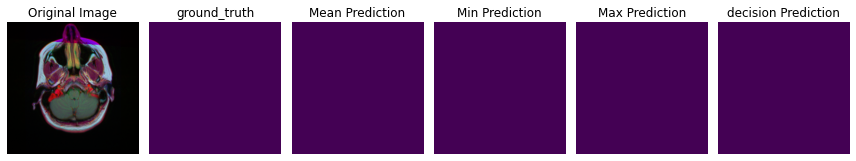

1/1 [==============================] - 1s 735ms/step


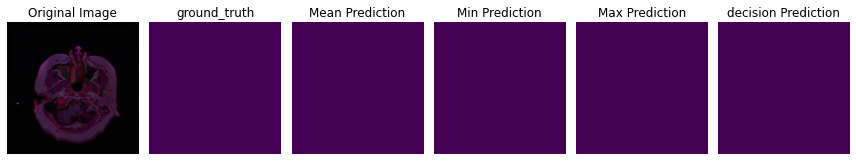

1/1 [==============================] - 1s 771ms/step


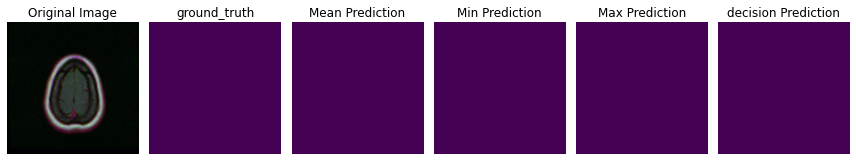

1/1 [==============================] - 1s 736ms/step


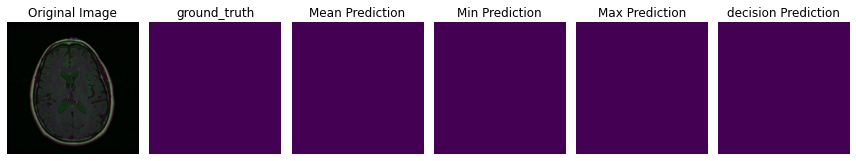

1/1 [==============================] - 1s 787ms/step


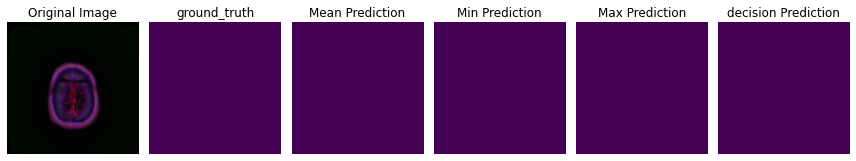

1/1 [==============================] - 1s 832ms/step


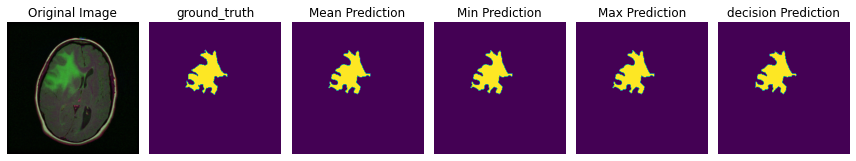

1/1 [==============================] - 1s 837ms/step


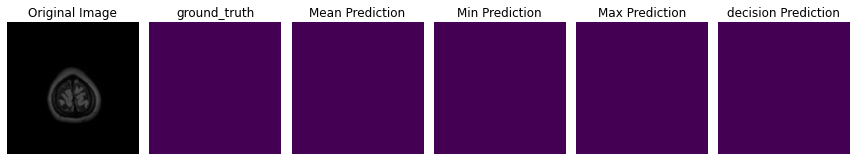

1/1 [==============================] - 1s 743ms/step


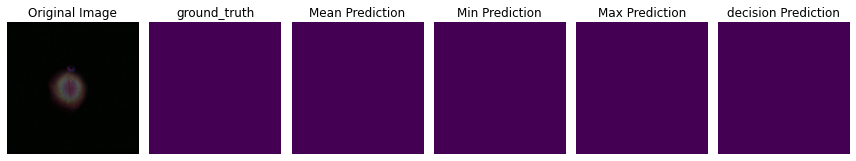

1/1 [==============================] - 1s 734ms/step


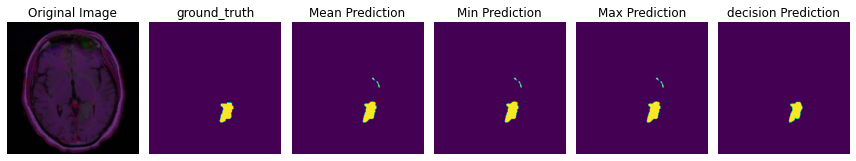

1/1 [==============================] - 1s 742ms/step


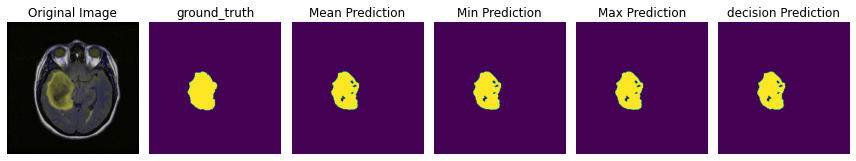

1/1 [==============================] - 1s 821ms/step


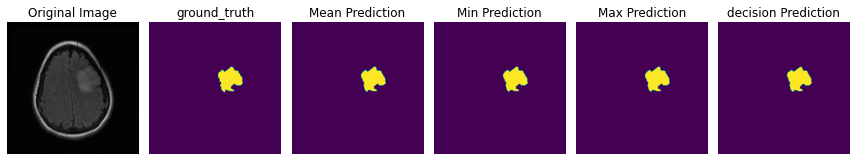

1/1 [==============================] - 1s 743ms/step


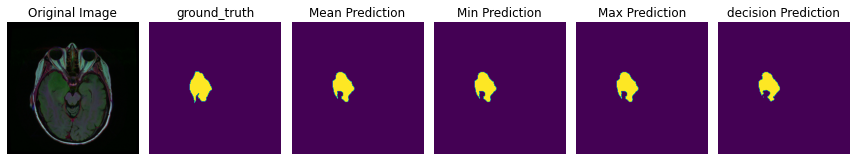

1/1 [==============================] - 1s 737ms/step


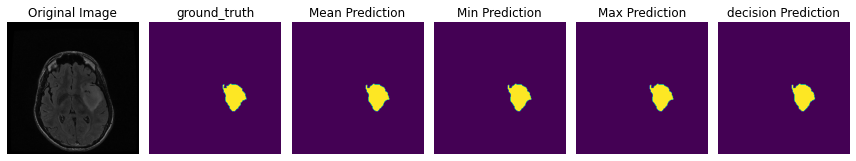

1/1 [==============================] - 1s 729ms/step


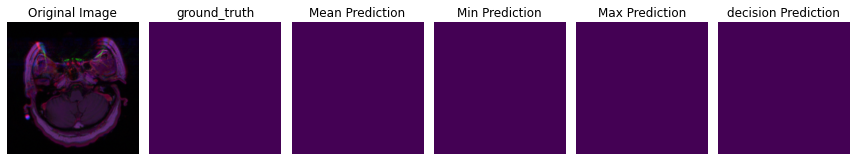

1/1 [==============================] - 1s 943ms/step


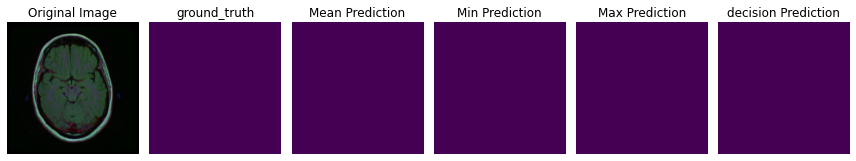

1/1 [==============================] - 1s 869ms/step


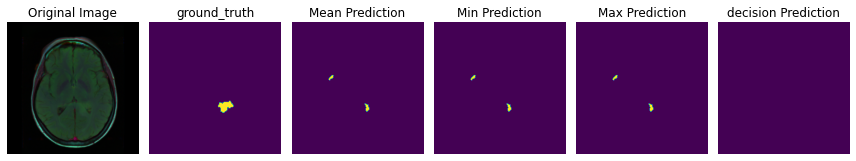

1/1 [==============================] - 1s 741ms/step


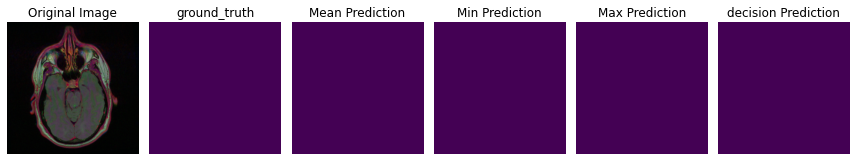

1/1 [==============================] - 1s 802ms/step


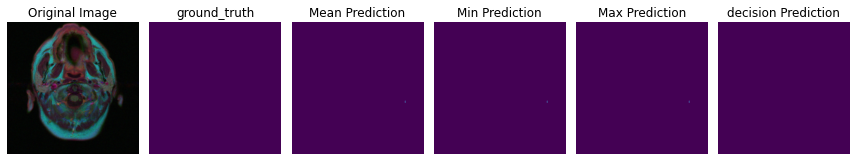

1/1 [==============================] - 1s 743ms/step


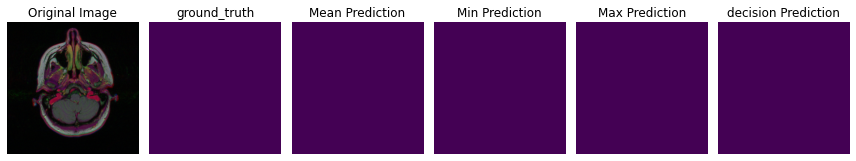

1/1 [==============================] - 1s 822ms/step


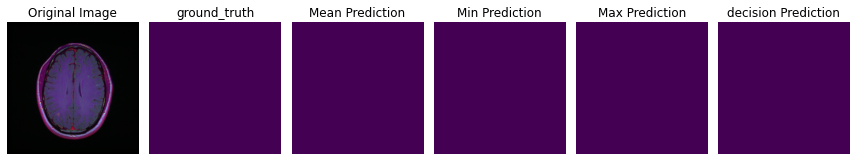

1/1 [==============================] - 1s 803ms/step


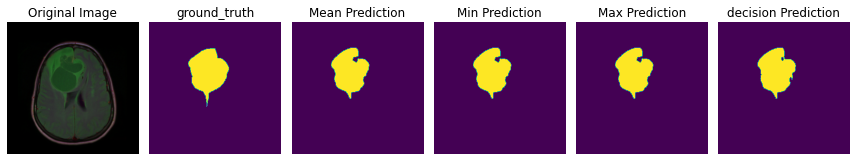

1/1 [==============================] - 1s 815ms/step


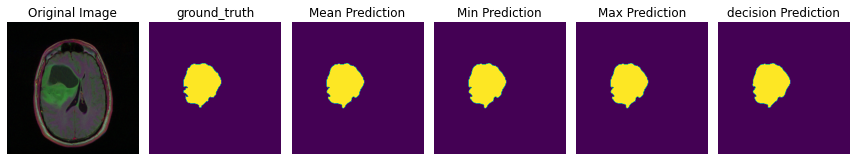

1/1 [==============================] - 1s 812ms/step


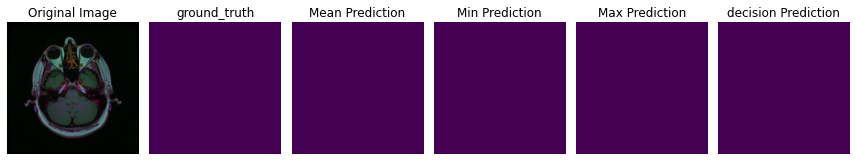

1/1 [==============================] - 1s 725ms/step


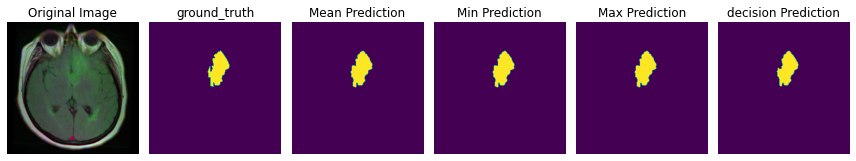

1/1 [==============================] - 1s 738ms/step


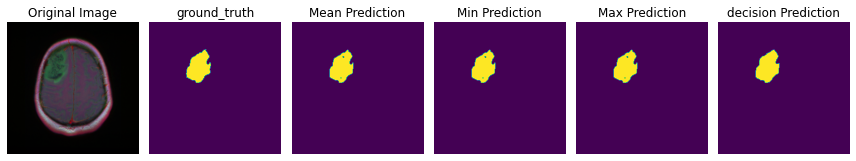

1/1 [==============================] - 1s 752ms/step


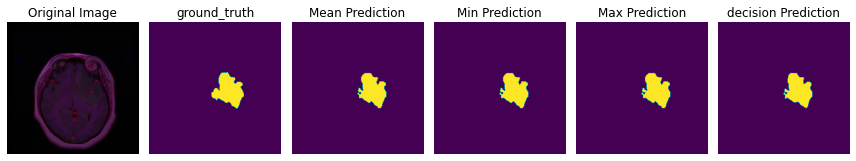

1/1 [==============================] - 1s 752ms/step


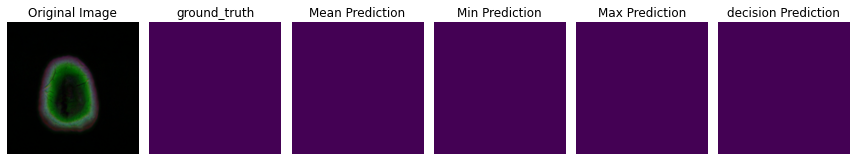

1/1 [==============================] - 1s 759ms/step


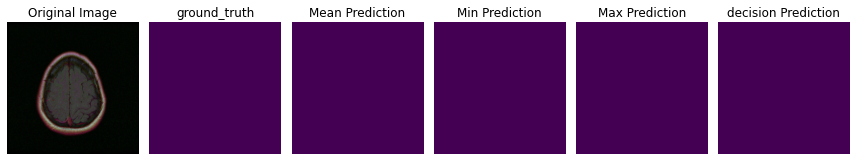

1/1 [==============================] - 1s 742ms/step


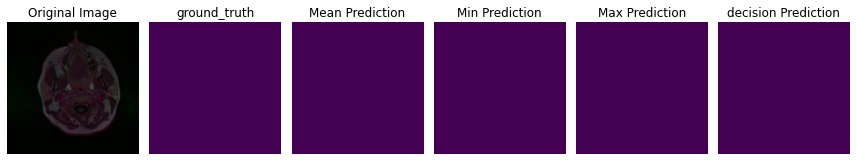

1/1 [==============================] - 1s 751ms/step


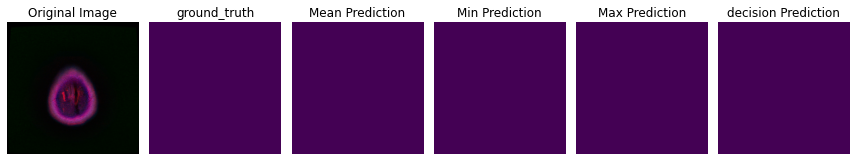

1/1 [==============================] - 1s 744ms/step


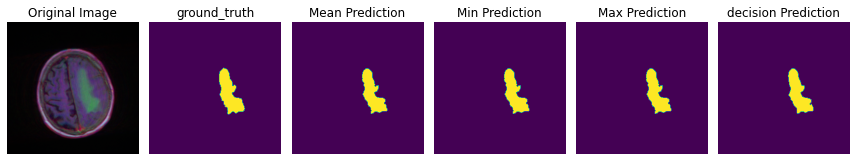

1/1 [==============================] - 1s 744ms/step


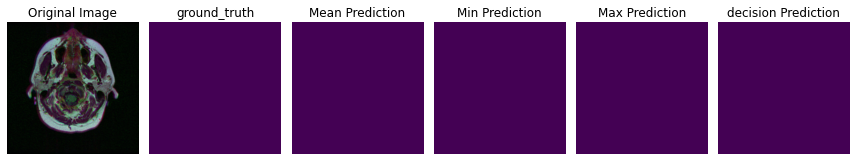

1/1 [==============================] - 1s 738ms/step


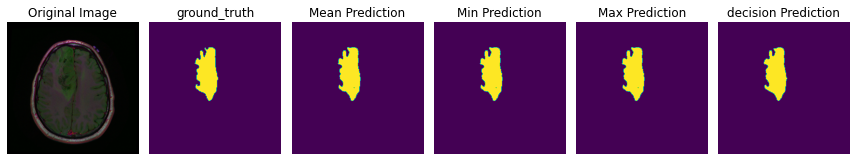

1/1 [==============================] - 1s 742ms/step


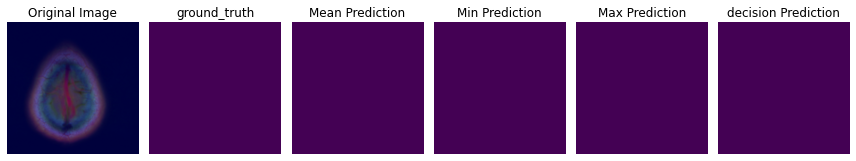

1/1 [==============================] - 1s 808ms/step


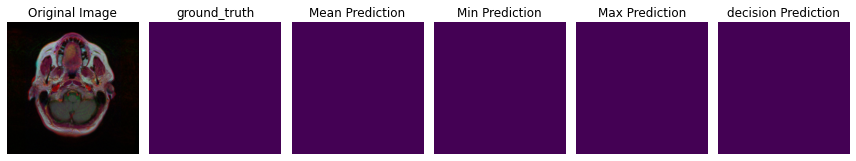

1/1 [==============================] - 1s 729ms/step


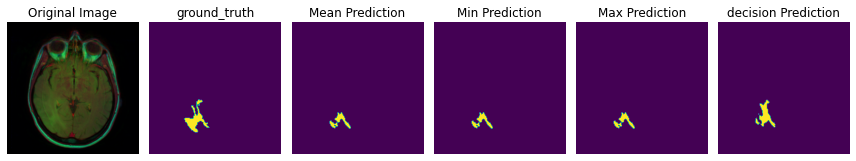

1/1 [==============================] - 1s 746ms/step


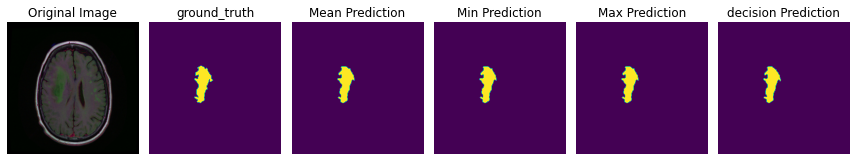

1/1 [==============================] - 1s 744ms/step


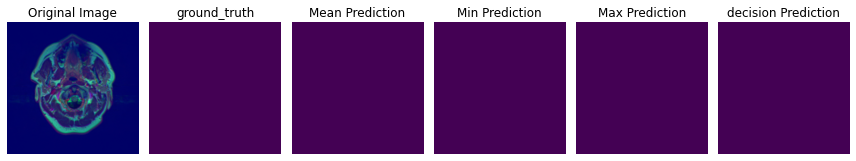

1/1 [==============================] - 1s 742ms/step


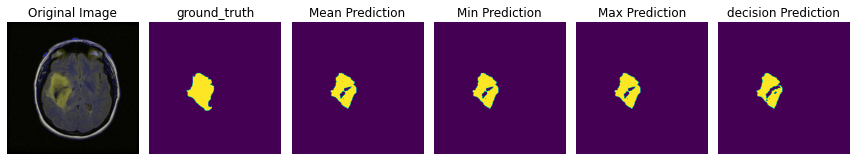

1/1 [==============================] - 1s 767ms/step


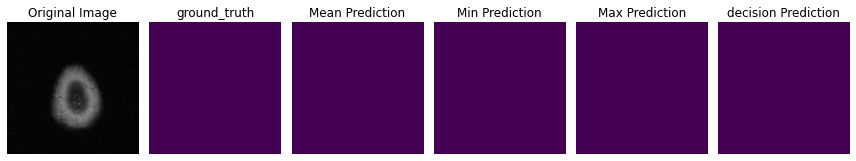

1/1 [==============================] - 1s 781ms/step


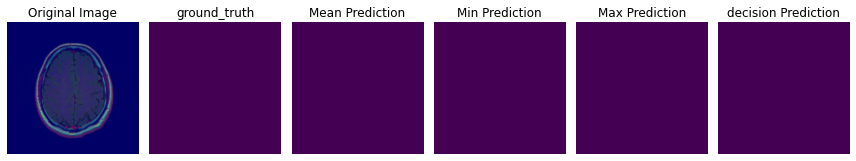

1/1 [==============================] - 1s 814ms/step


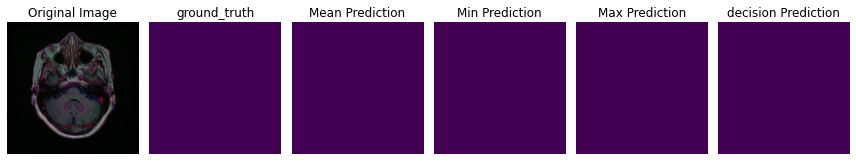

1/1 [==============================] - 1s 745ms/step


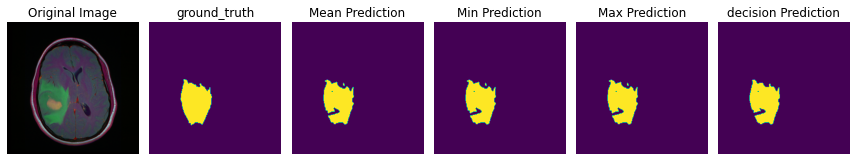

1/1 [==============================] - 1s 817ms/step


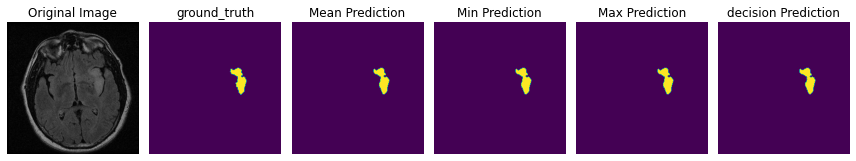

1/1 [==============================] - 1s 751ms/step


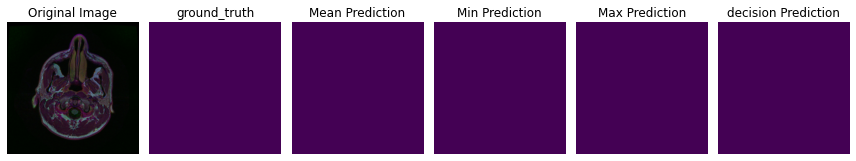

1/1 [==============================] - 1s 757ms/step


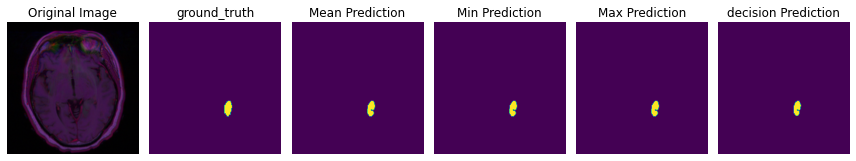

1/1 [==============================] - 1s 824ms/step


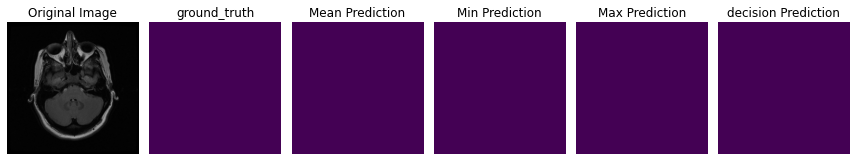

1/1 [==============================] - 1s 757ms/step


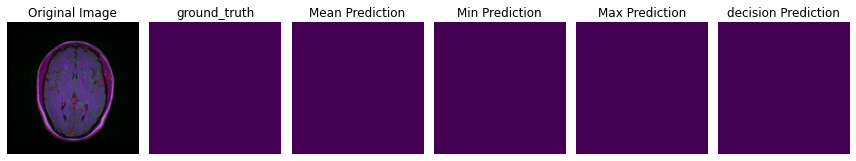

1/1 [==============================] - 1s 729ms/step


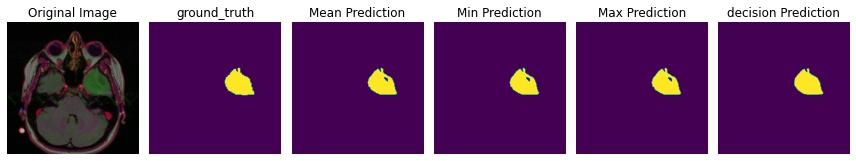

1/1 [==============================] - 1s 806ms/step


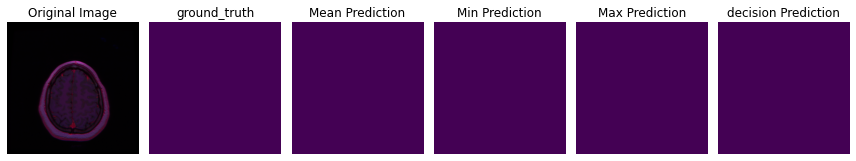

1/1 [==============================] - 1s 756ms/step


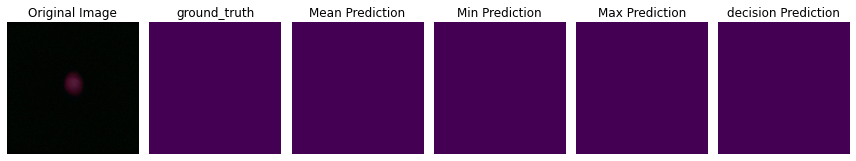

1/1 [==============================] - 1s 746ms/step


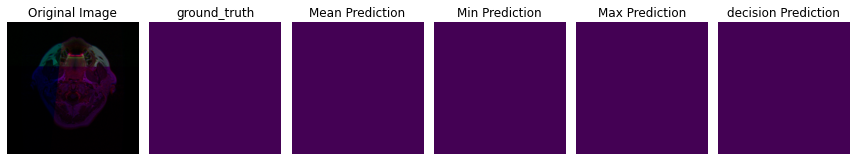

1/1 [==============================] - 1s 819ms/step


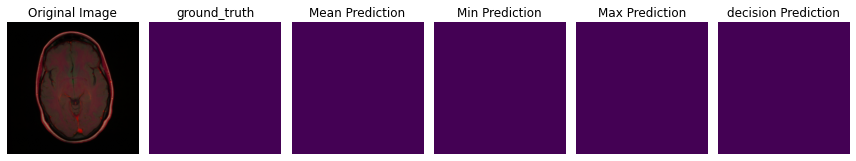

1/1 [==============================] - 1s 812ms/step


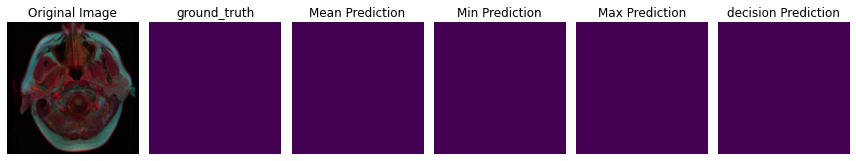

1/1 [==============================] - 1s 814ms/step


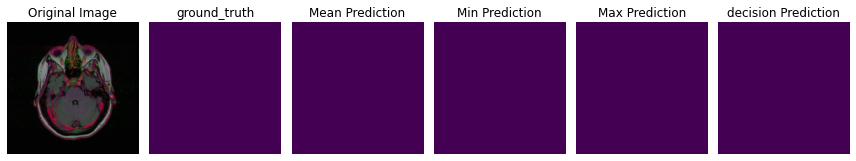

1/1 [==============================] - 1s 739ms/step


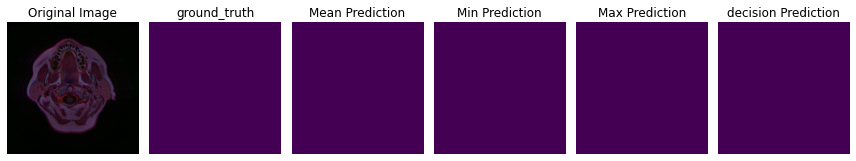

1/1 [==============================] - 1s 808ms/step


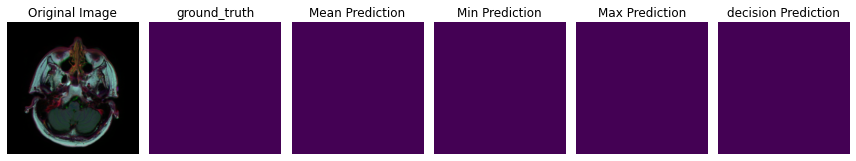

1/1 [==============================] - 1s 745ms/step


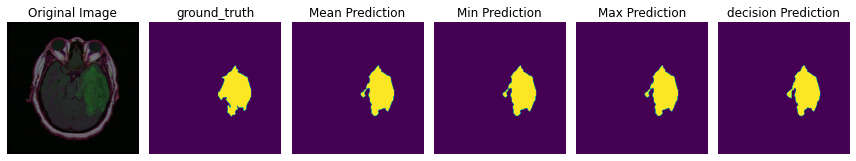

1/1 [==============================] - 1s 717ms/step


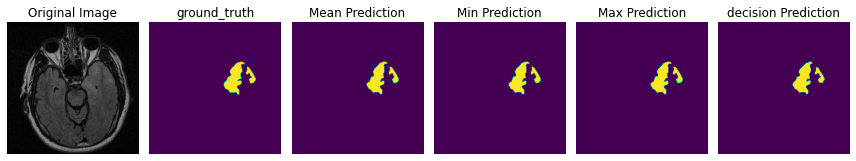

1/1 [==============================] - 1s 794ms/step


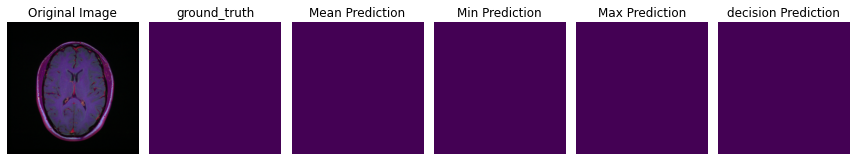

1/1 [==============================] - 1s 765ms/step


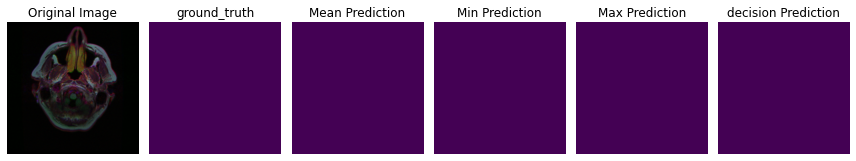

1/1 [==============================] - 1s 794ms/step


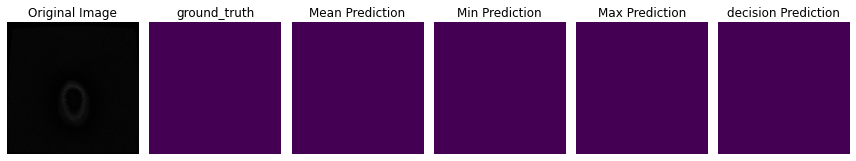

1/1 [==============================] - 1s 948ms/step


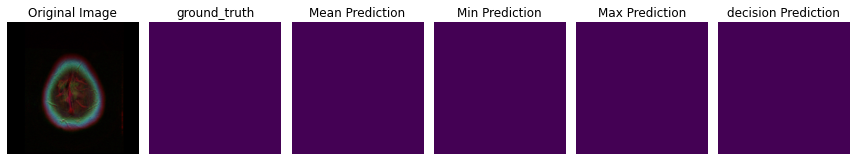

1/1 [==============================] - 1s 731ms/step


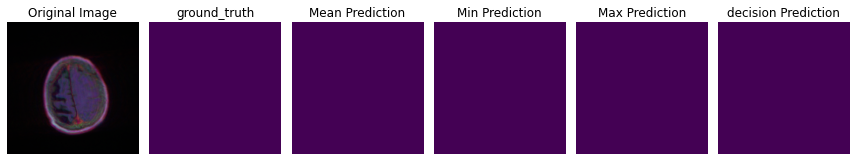

1/1 [==============================] - 1s 743ms/step


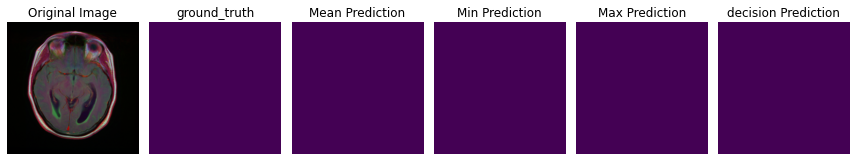

1/1 [==============================] - 1s 733ms/step


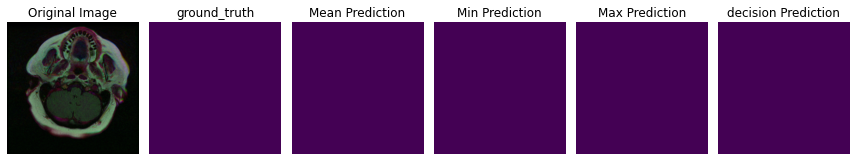

1/1 [==============================] - 1s 727ms/step


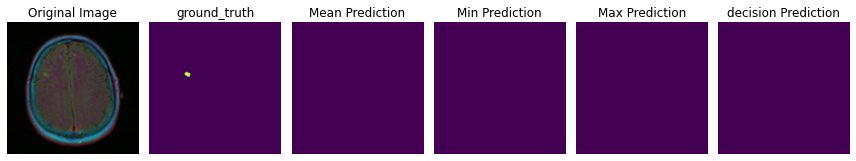

1/1 [==============================] - 1s 724ms/step


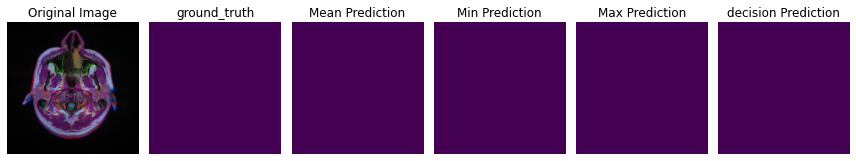

1/1 [==============================] - 1s 813ms/step


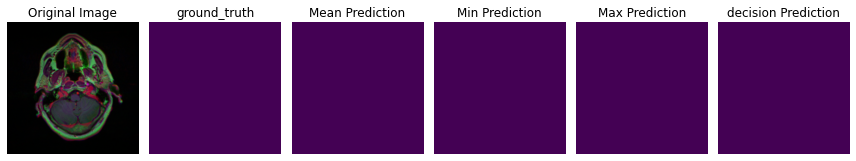

1/1 [==============================] - 1s 886ms/step


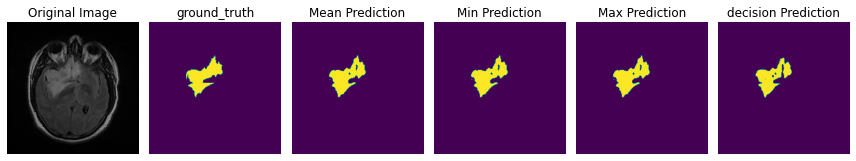

1/1 [==============================] - 1s 784ms/step


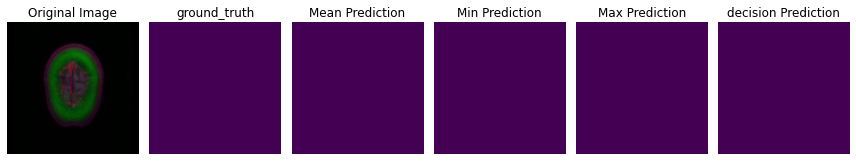

1/1 [==============================] - 1s 733ms/step


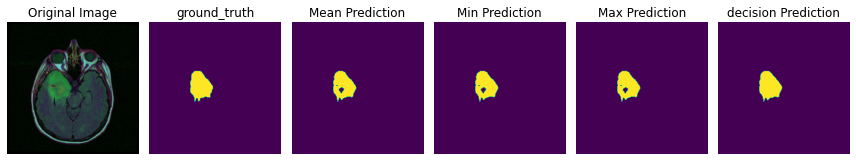

1/1 [==============================] - 1s 797ms/step


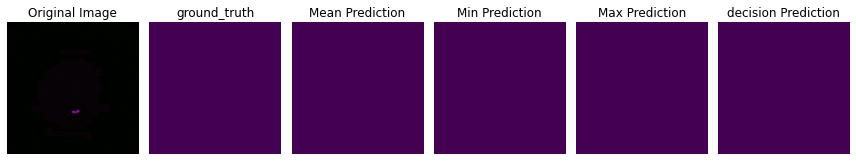

1/1 [==============================] - 1s 735ms/step


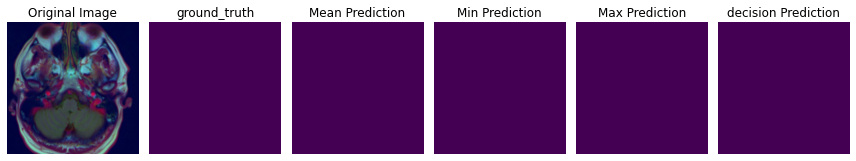

1/1 [==============================] - 1s 729ms/step


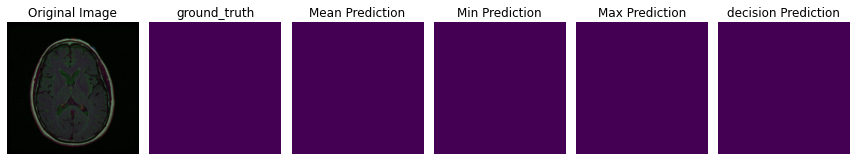

1/1 [==============================] - 1s 709ms/step


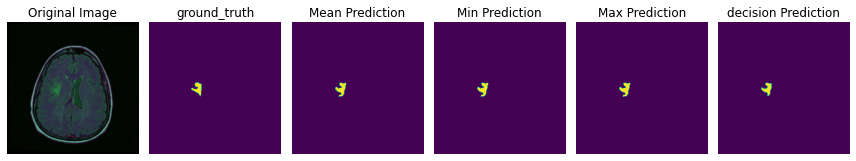

1/1 [==============================] - 1s 737ms/step


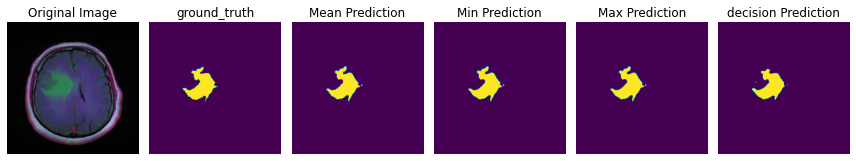

1/1 [==============================] - 1s 729ms/step


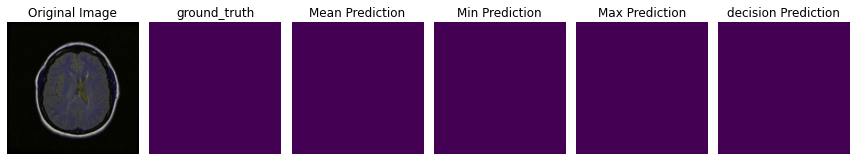

1/1 [==============================] - 1s 720ms/step


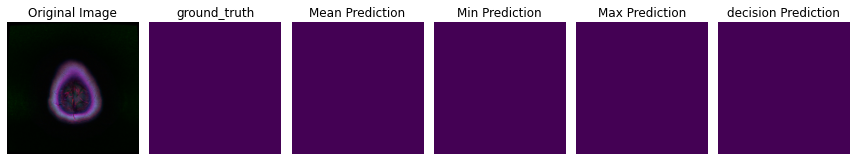

1/1 [==============================] - 1s 709ms/step


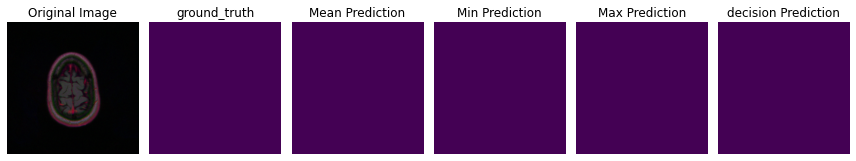

1/1 [==============================] - 1s 743ms/step


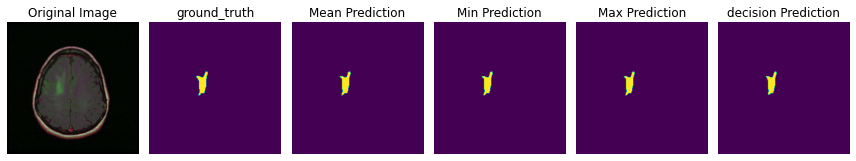

1/1 [==============================] - 1s 734ms/step


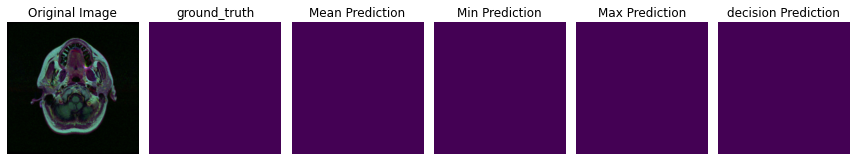

1/1 [==============================] - 1s 728ms/step


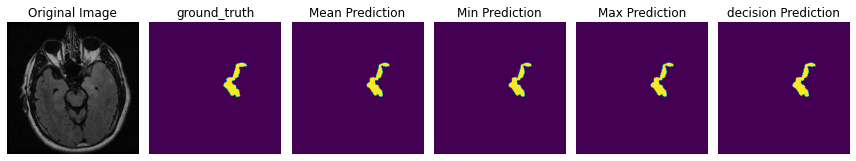

1/1 [==============================] - 1s 735ms/step


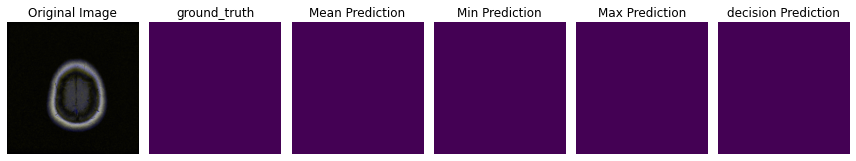

1/1 [==============================] - 1s 790ms/step


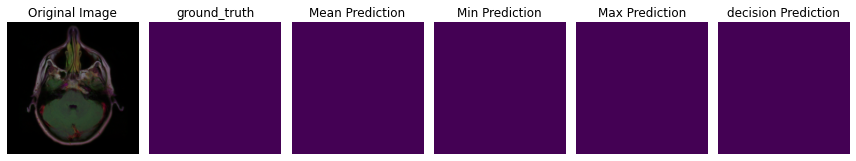

1/1 [==============================] - 1s 725ms/step


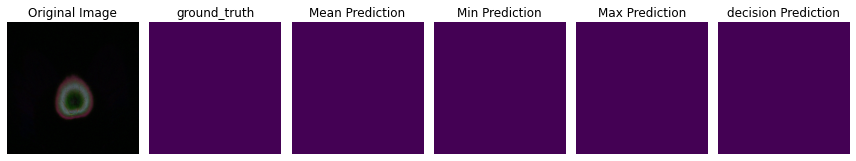

1/1 [==============================] - 1s 752ms/step


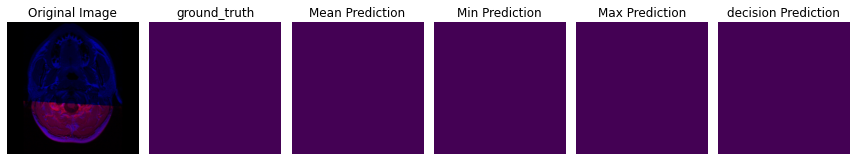

1/1 [==============================] - 1s 802ms/step


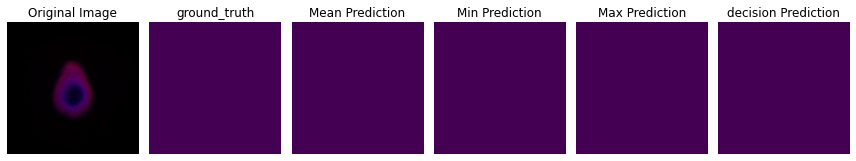

1/1 [==============================] - 1s 744ms/step


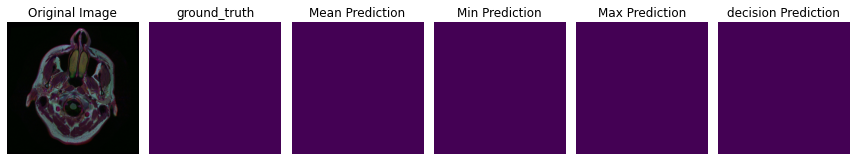

1/1 [==============================] - 1s 743ms/step


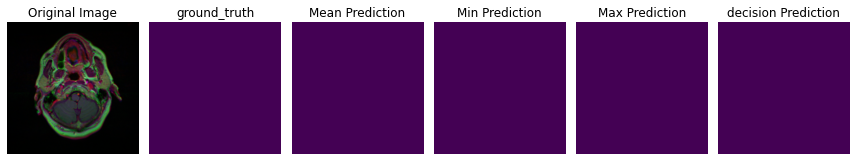

1/1 [==============================] - 1s 738ms/step


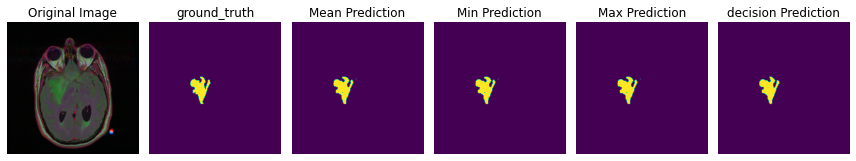

1/1 [==============================] - 1s 789ms/step


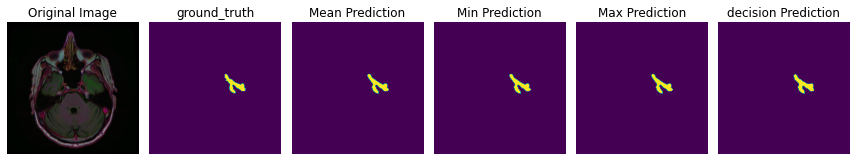

1/1 [==============================] - 1s 732ms/step


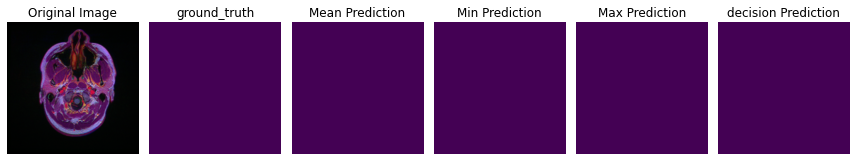

1/1 [==============================] - 1s 705ms/step


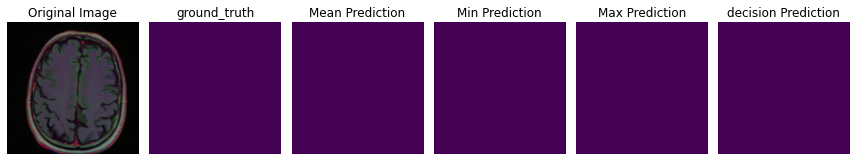

1/1 [==============================] - 1s 798ms/step


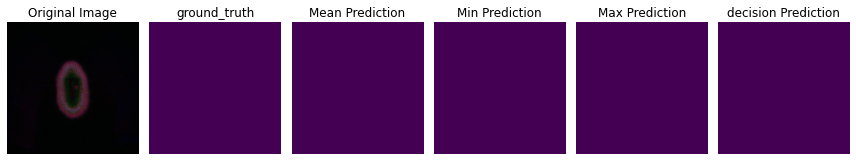

1/1 [==============================] - 1s 739ms/step


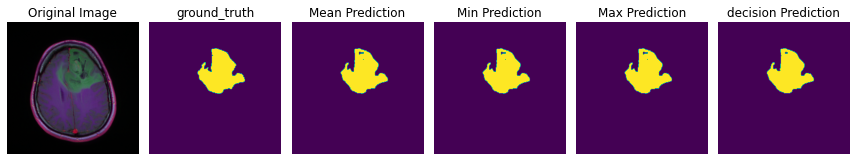

1/1 [==============================] - 1s 729ms/step


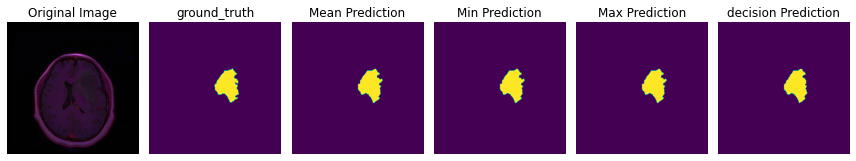

1/1 [==============================] - 1s 714ms/step


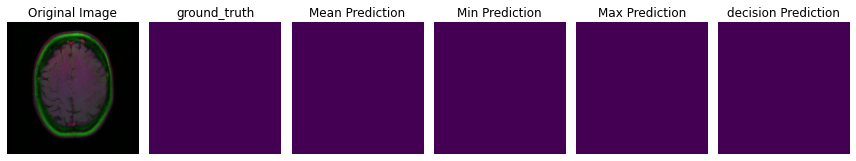

1/1 [==============================] - 1s 750ms/step


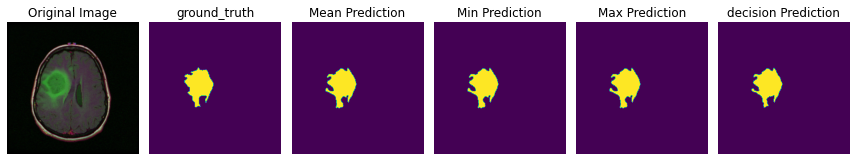

1/1 [==============================] - 1s 731ms/step


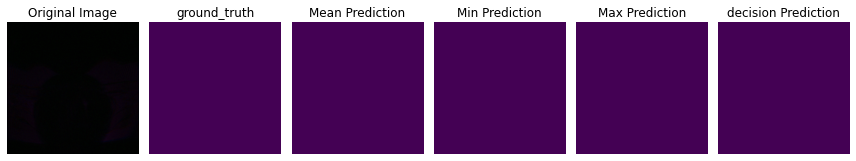

1/1 [==============================] - 1s 803ms/step


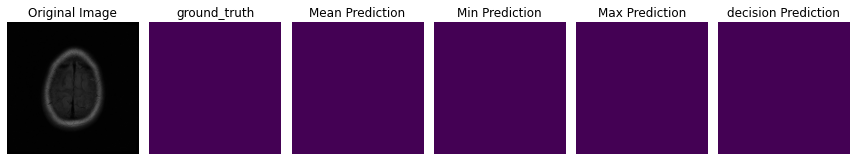

1/1 [==============================] - 1s 860ms/step


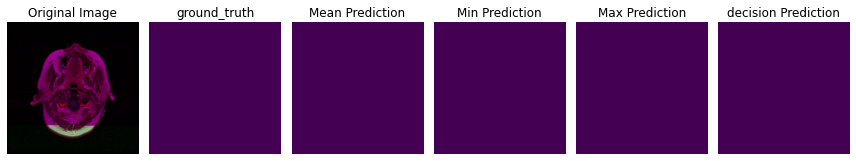

1/1 [==============================] - 1s 925ms/step


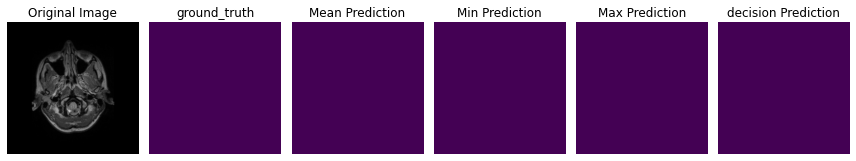

1/1 [==============================] - 1s 986ms/step


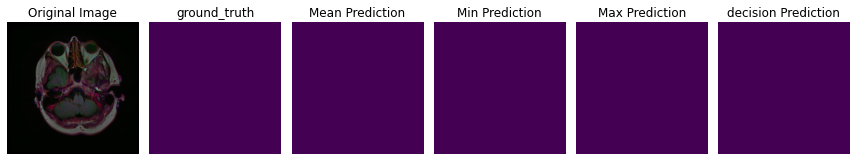

1/1 [==============================] - 1s 756ms/step


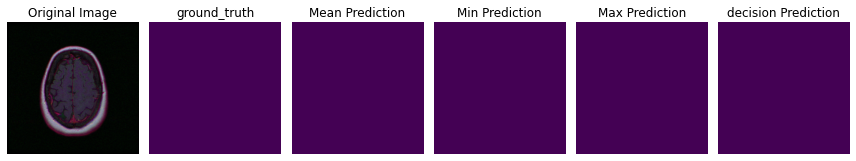

1/1 [==============================] - 1s 1s/step


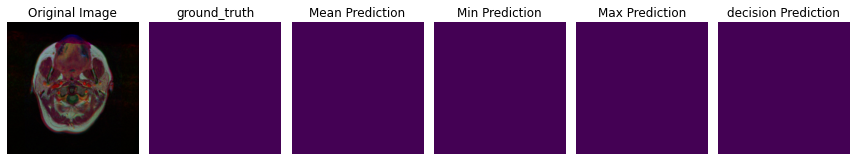

1/1 [==============================] - 1s 770ms/step


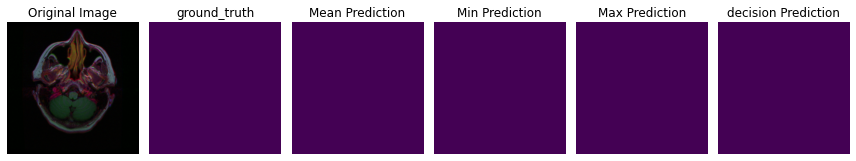

1/1 [==============================] - 1s 924ms/step


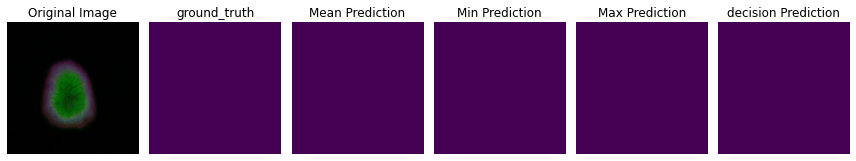

1/1 [==============================] - 1s 776ms/step


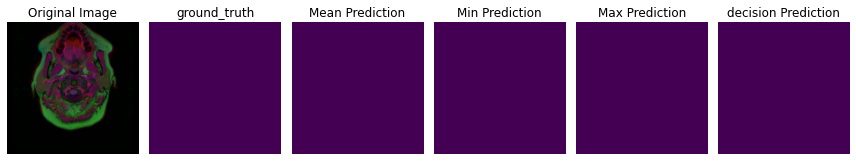

1/1 [==============================] - 1s 1s/step


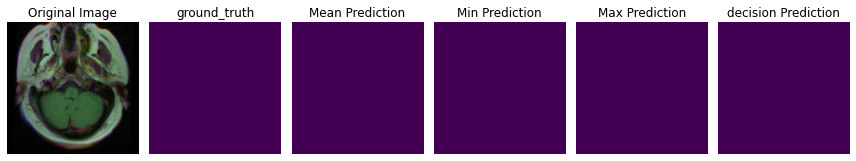

1/1 [==============================] - 1s 825ms/step


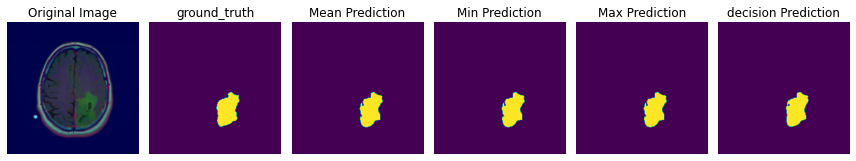

1/1 [==============================] - 1s 795ms/step


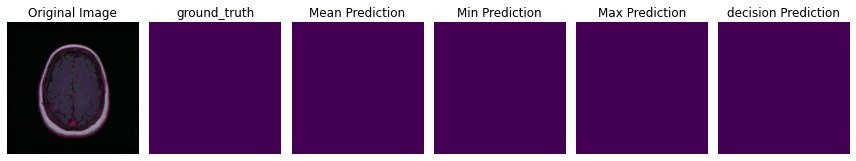

1/1 [==============================] - 1s 885ms/step


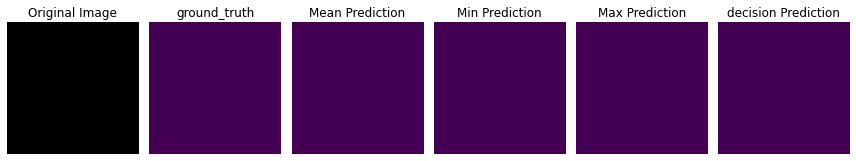

1/1 [==============================] - 1s 766ms/step


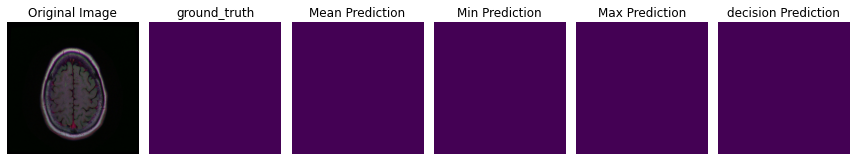

1/1 [==============================] - 1s 827ms/step


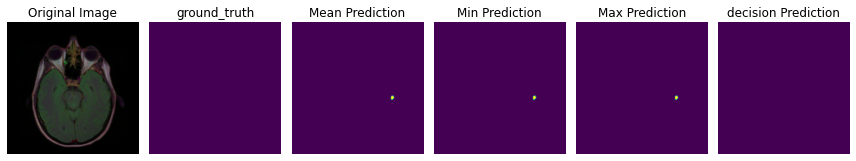

1/1 [==============================] - 1s 1s/step


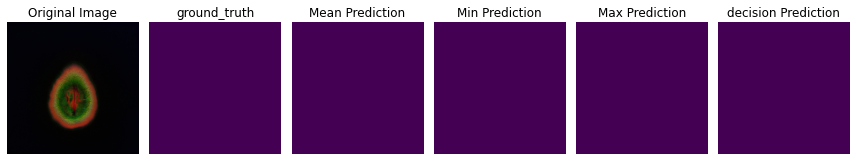

1/1 [==============================] - 1s 796ms/step


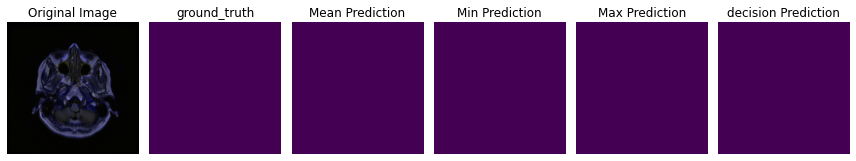

1/1 [==============================] - 1s 844ms/step


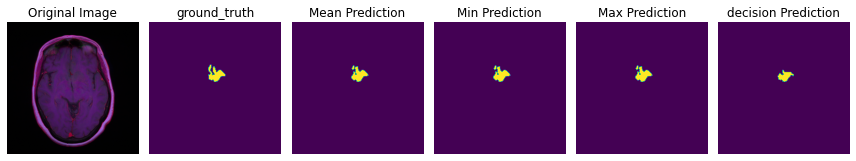

1/1 [==============================] - 1s 1s/step


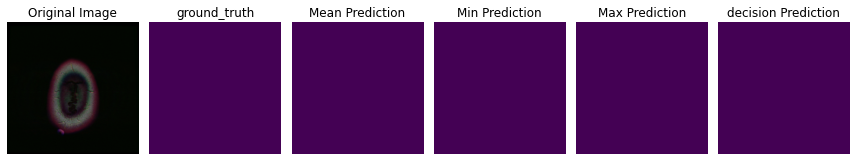

1/1 [==============================] - 1s 1s/step


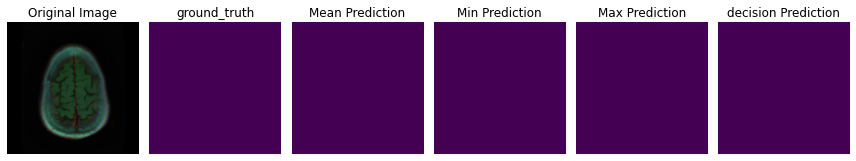

1/1 [==============================] - 1s 843ms/step


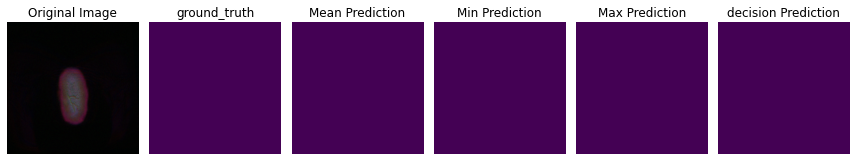

1/1 [==============================] - 1s 889ms/step


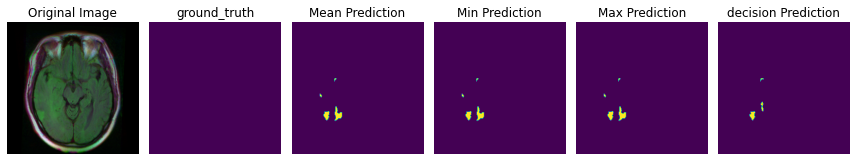

1/1 [==============================] - 1s 774ms/step


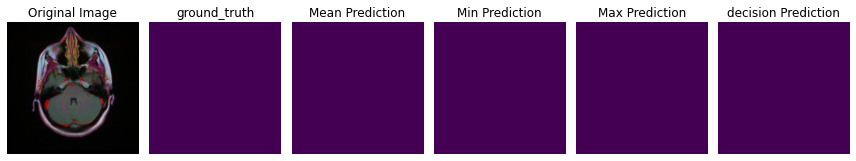

1/1 [==============================] - 1s 906ms/step


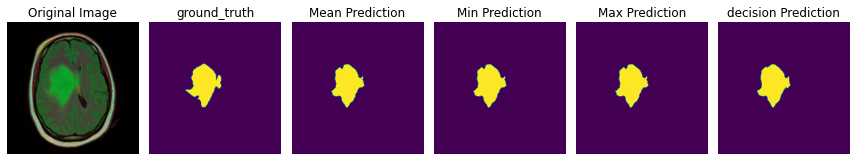

1/1 [==============================] - 1s 884ms/step


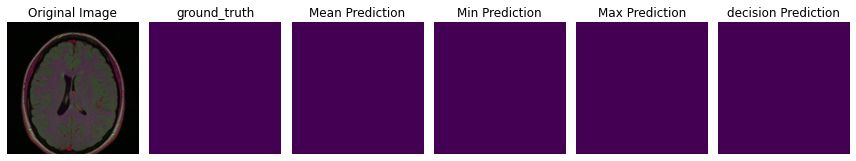

1/1 [==============================] - 1s 915ms/step


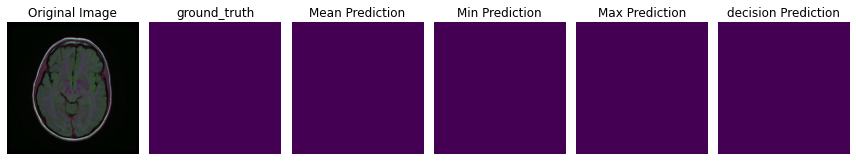

1/1 [==============================] - 1s 839ms/step


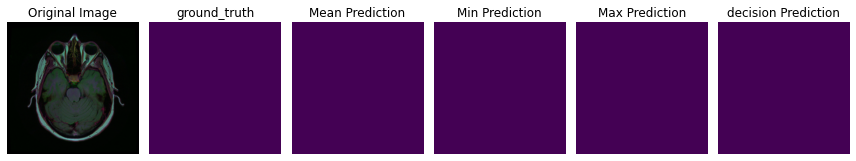

1/1 [==============================] - 1s 828ms/step


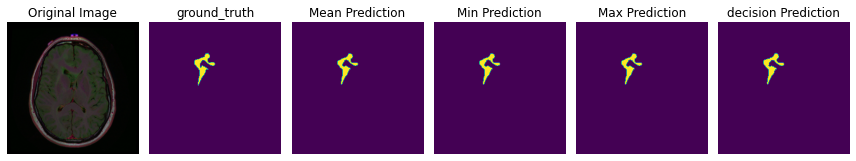

1/1 [==============================] - 1s 850ms/step


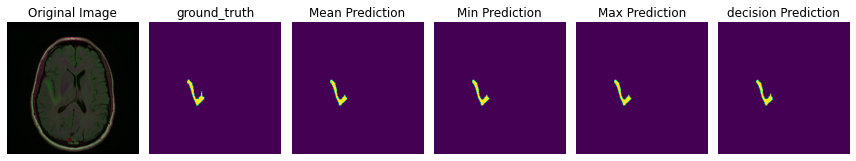

1/1 [==============================] - 1s 980ms/step


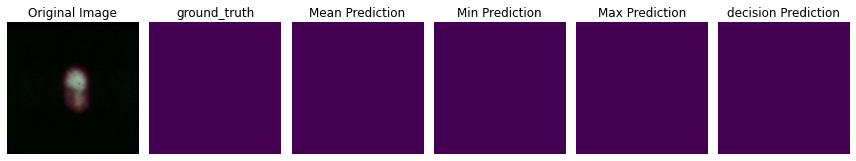

1/1 [==============================] - 1s 1s/step


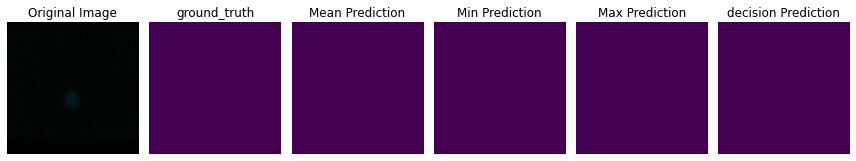

1/1 [==============================] - 1s 752ms/step


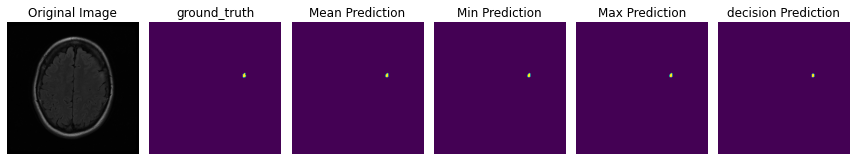

1/1 [==============================] - 1s 940ms/step


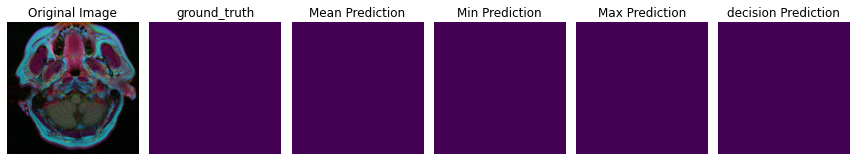

1/1 [==============================] - 1s 756ms/step


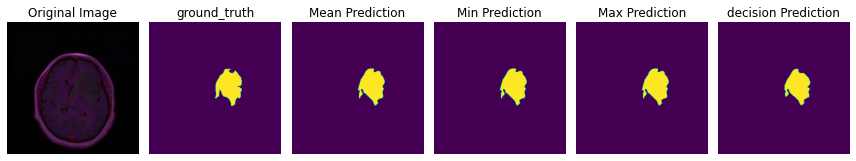

1/1 [==============================] - 1s 886ms/step


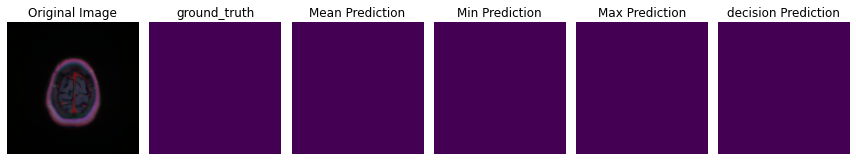

1/1 [==============================] - 1s 928ms/step


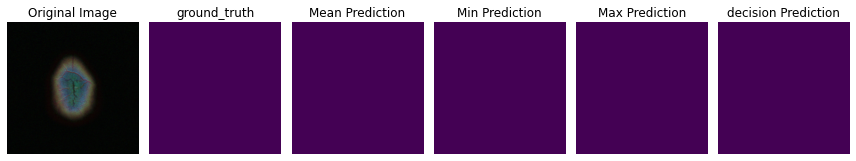

1/1 [==============================] - 1s 794ms/step


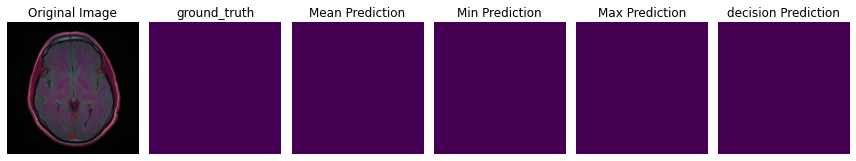

1/1 [==============================] - 1s 999ms/step


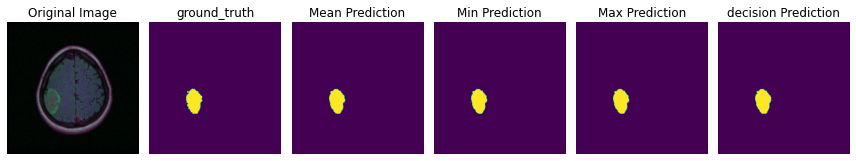

1/1 [==============================] - 1s 773ms/step


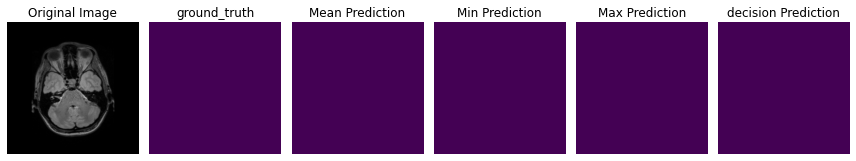

1/1 [==============================] - 1s 942ms/step


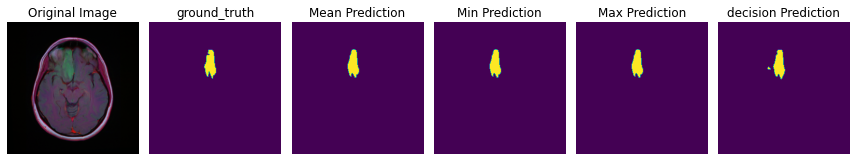

1/1 [==============================] - 1s 842ms/step


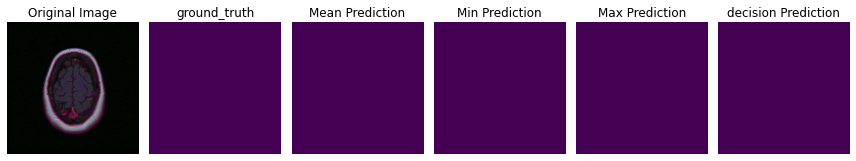

1/1 [==============================] - 1s 761ms/step


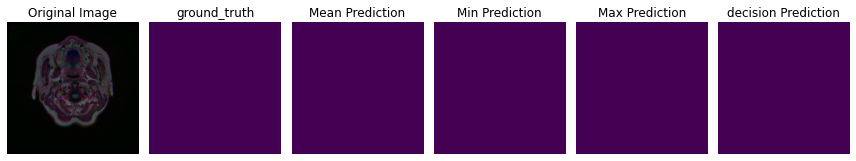

1/1 [==============================] - 1s 777ms/step


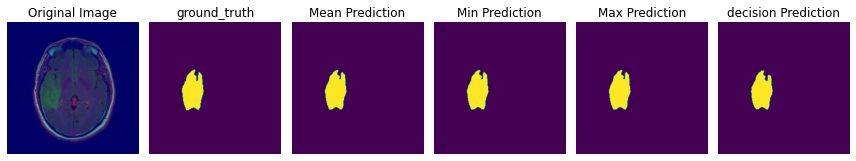

1/1 [==============================] - 1s 949ms/step


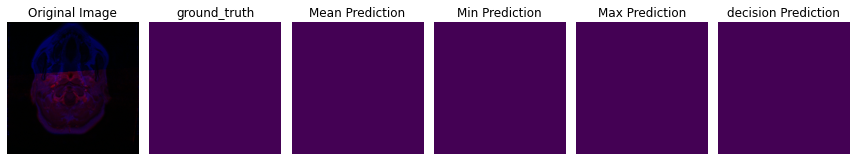

1/1 [==============================] - 1s 1s/step


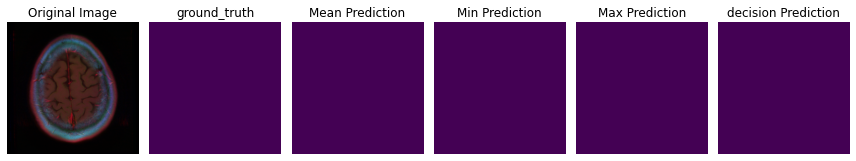

1/1 [==============================] - 1s 1s/step


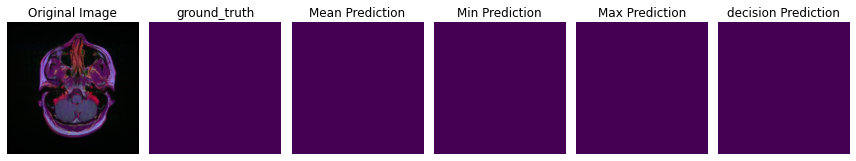

1/1 [==============================] - 1s 776ms/step


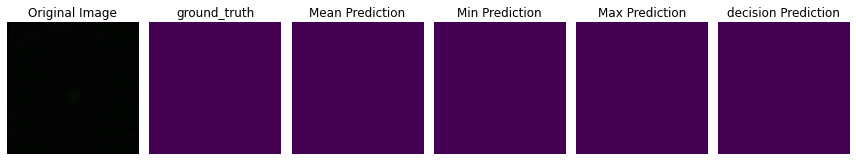

1/1 [==============================] - 1s 778ms/step


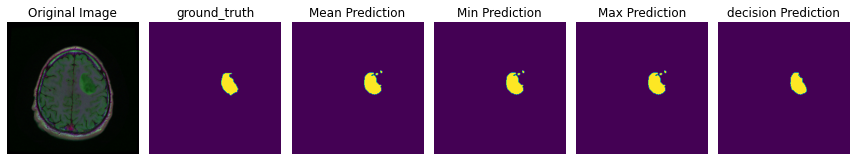

1/1 [==============================] - 1s 806ms/step


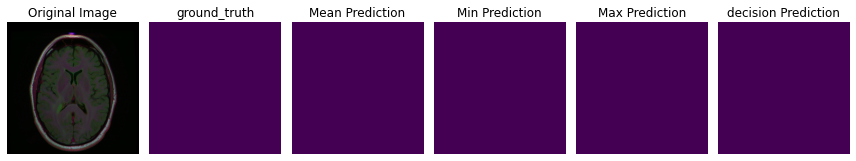

1/1 [==============================] - 1s 768ms/step


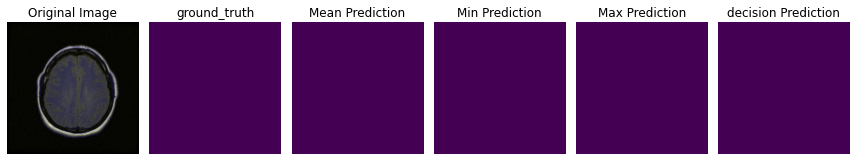

1/1 [==============================] - 1s 1s/step


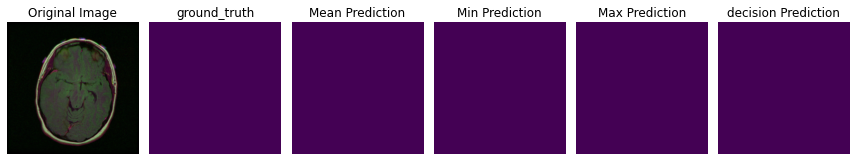

1/1 [==============================] - 1s 817ms/step


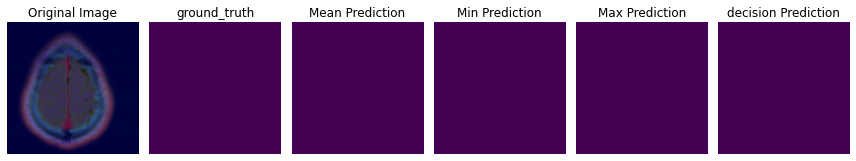

1/1 [==============================] - 1s 762ms/step


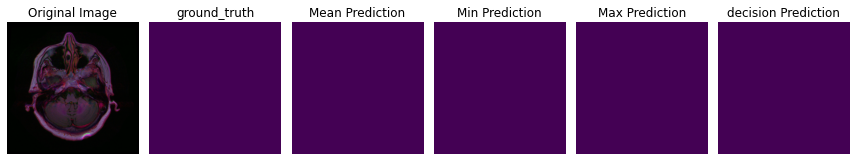

1/1 [==============================] - 1s 823ms/step


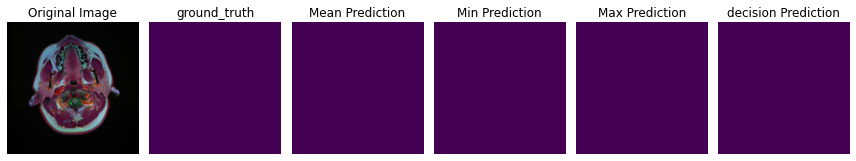

1/1 [==============================] - 1s 770ms/step


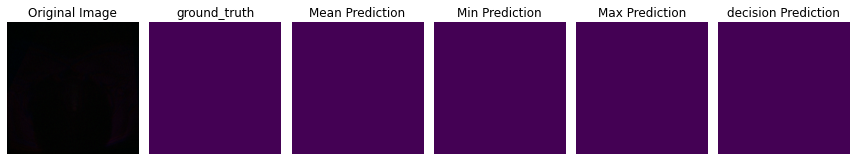

1/1 [==============================] - 1s 768ms/step


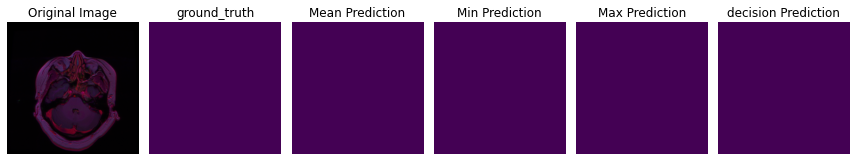

1/1 [==============================] - 1s 772ms/step


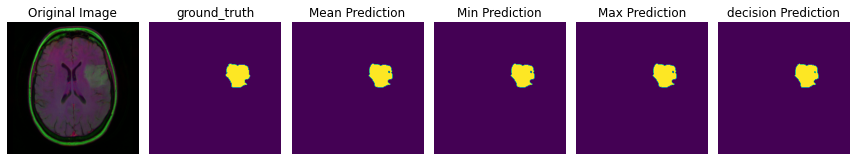

1/1 [==============================] - 1s 1s/step


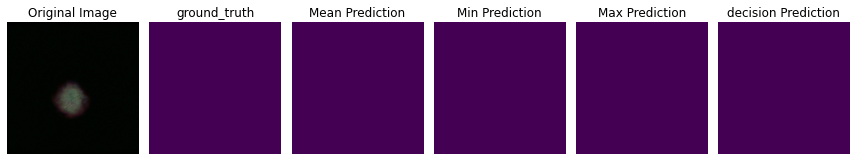

1/1 [==============================] - 1s 845ms/step


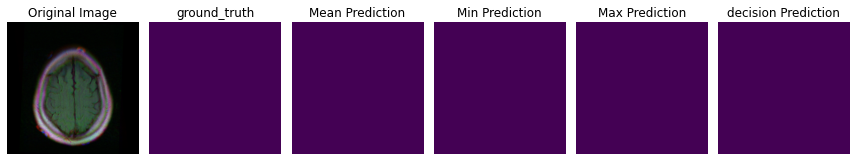

1/1 [==============================] - 1s 1s/step


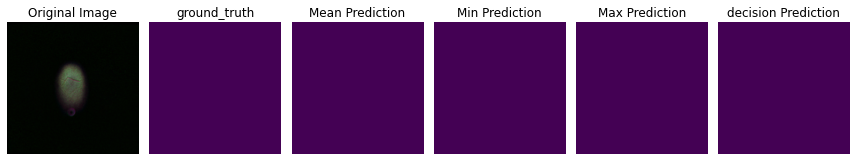

1/1 [==============================] - 1s 950ms/step


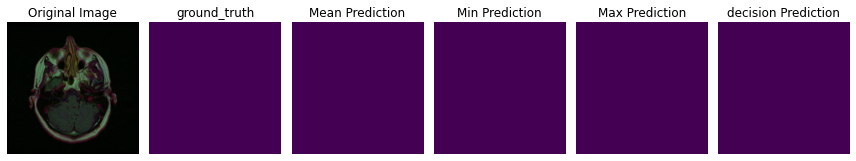

1/1 [==============================] - 1s 742ms/step


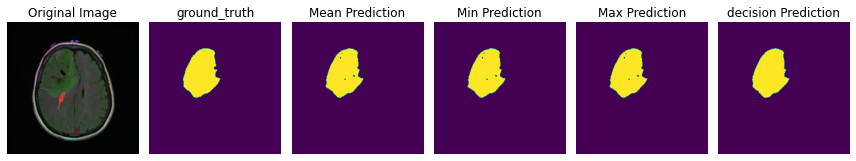

1/1 [==============================] - 1s 736ms/step


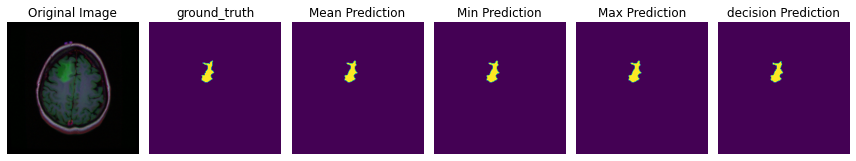

1/1 [==============================] - 1s 727ms/step


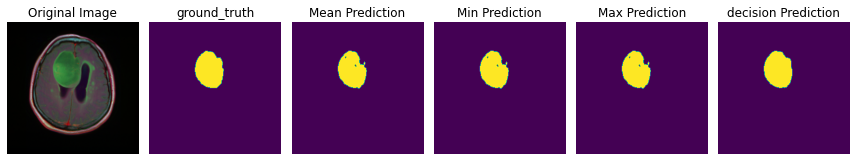

1/1 [==============================] - 1s 770ms/step


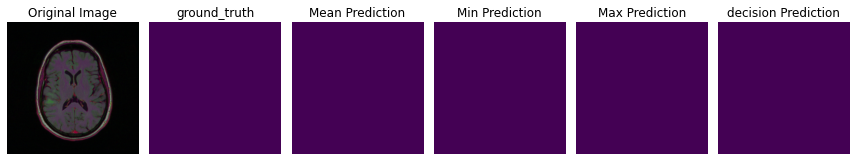

1/1 [==============================] - 1s 893ms/step


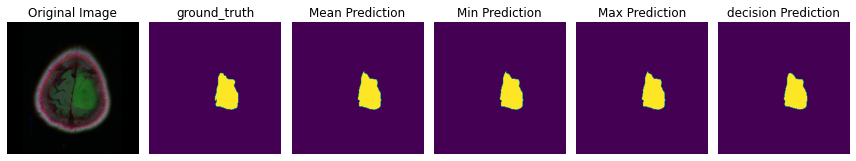

1/1 [==============================] - 1s 796ms/step


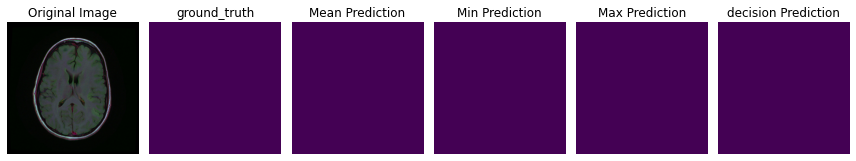

1/1 [==============================] - 1s 758ms/step


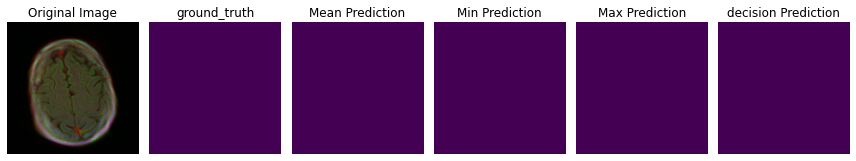

1/1 [==============================] - 1s 734ms/step


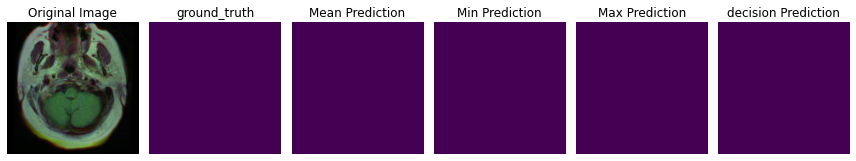

1/1 [==============================] - 1s 739ms/step


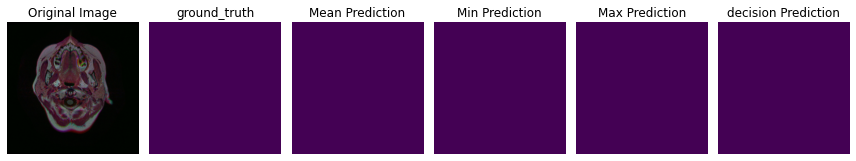

1/1 [==============================] - 1s 747ms/step


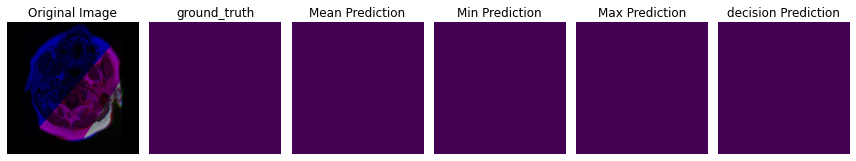

1/1 [==============================] - 1s 752ms/step


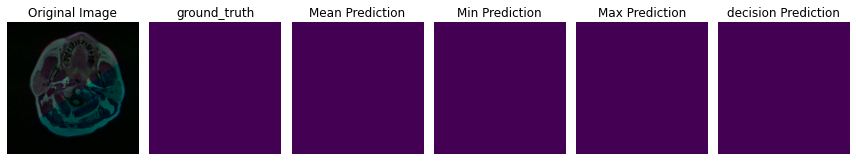

1/1 [==============================] - 1s 742ms/step


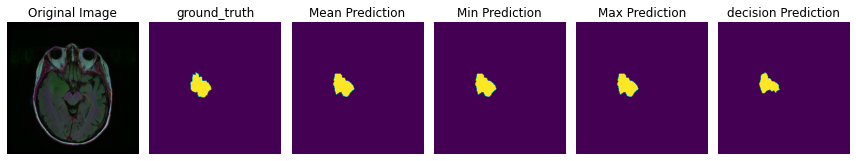

1/1 [==============================] - 1s 749ms/step


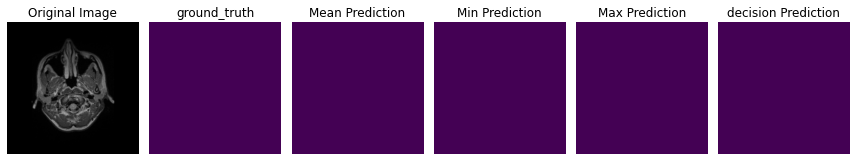

1/1 [==============================] - 1s 814ms/step


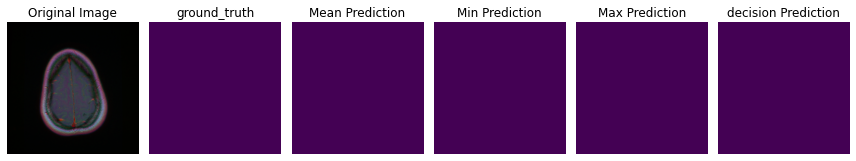

1/1 [==============================] - 1s 734ms/step


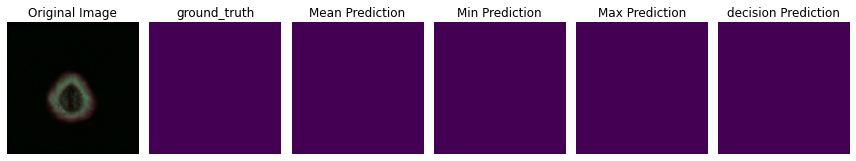

1/1 [==============================] - 1s 737ms/step


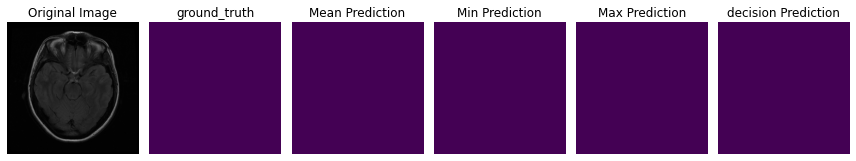

1/1 [==============================] - 1s 813ms/step


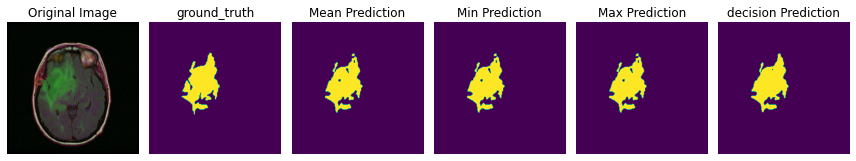

1/1 [==============================] - 1s 823ms/step


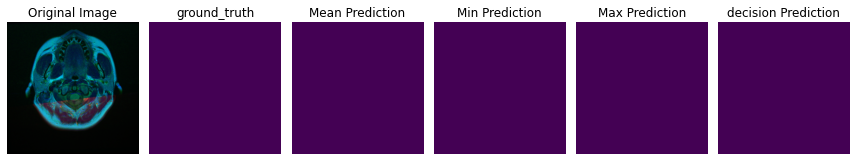

1/1 [==============================] - 1s 802ms/step


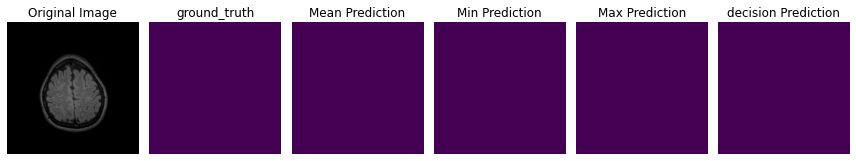

1/1 [==============================] - 1s 749ms/step


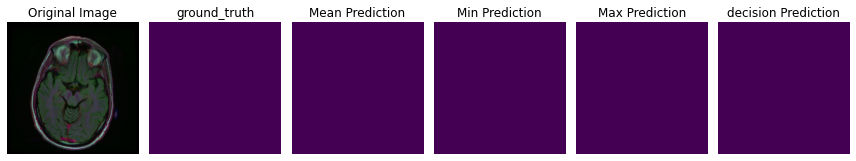

1/1 [==============================] - 1s 816ms/step


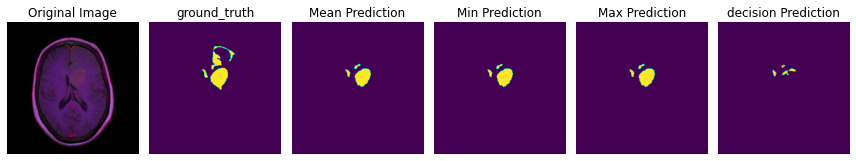

1/1 [==============================] - 1s 732ms/step


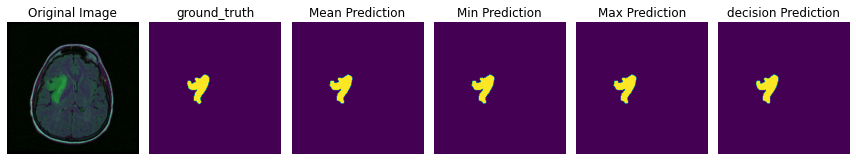

1/1 [==============================] - 1s 725ms/step


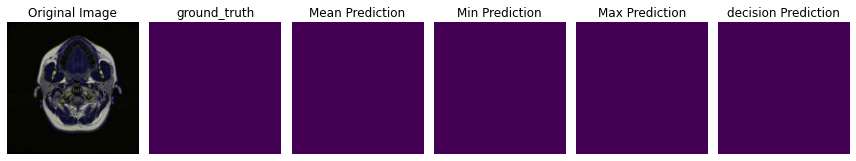

1/1 [==============================] - 1s 753ms/step


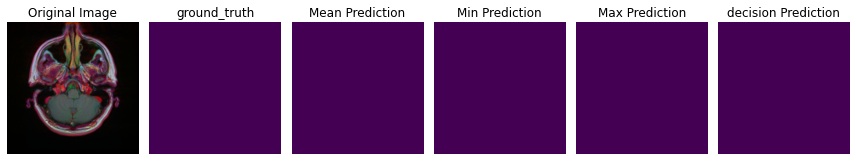

1/1 [==============================] - 1s 742ms/step


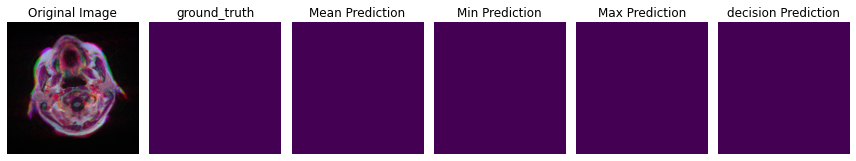

1/1 [==============================] - 1s 754ms/step


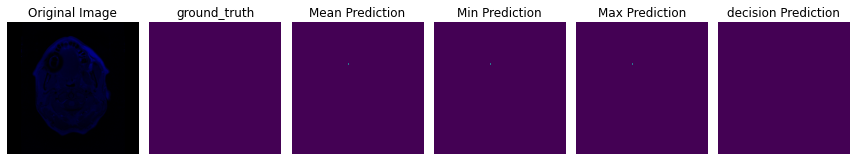

1/1 [==============================] - 1s 823ms/step


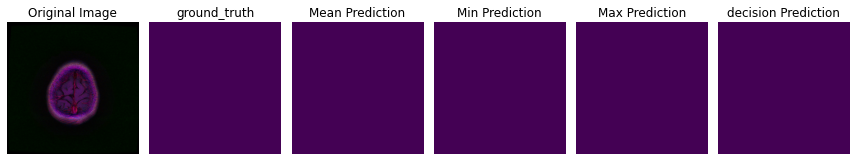

1/1 [==============================] - 1s 766ms/step


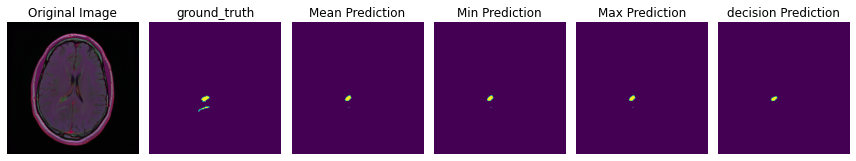

1/1 [==============================] - 1s 900ms/step


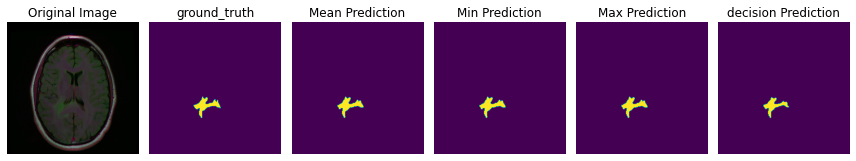

1/1 [==============================] - 1s 824ms/step


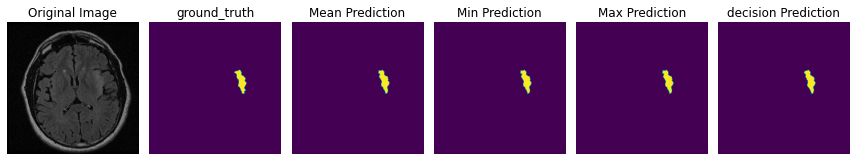

1/1 [==============================] - 1s 867ms/step


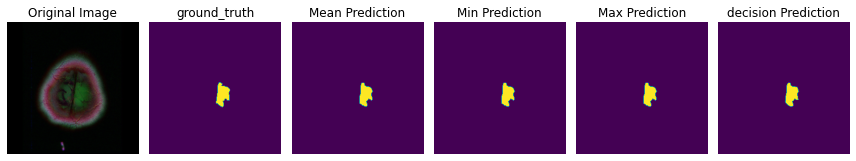

1/1 [==============================] - 1s 745ms/step


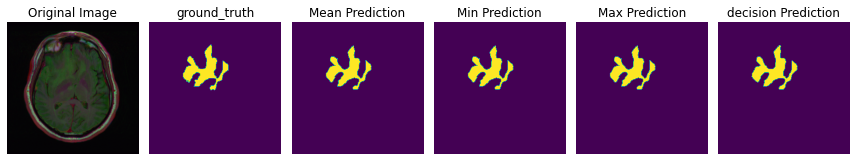

1/1 [==============================] - 1s 869ms/step


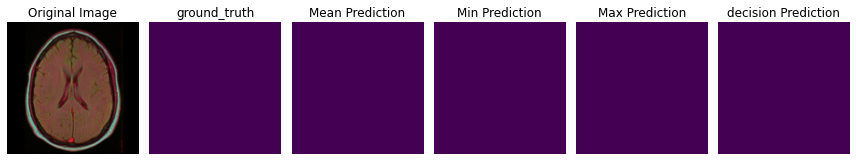

1/1 [==============================] - 1s 753ms/step


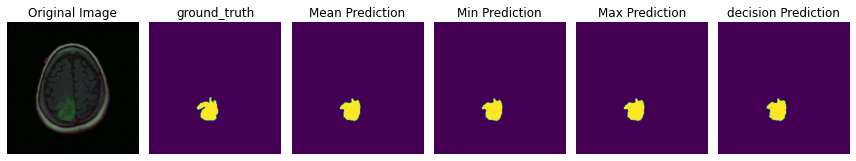

1/1 [==============================] - 1s 749ms/step


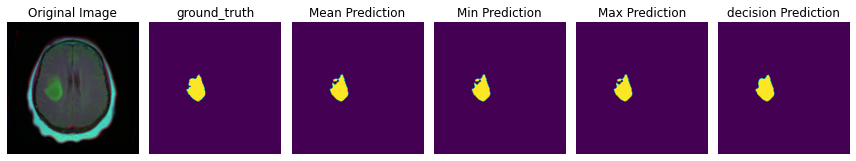

1/1 [==============================] - 1s 754ms/step


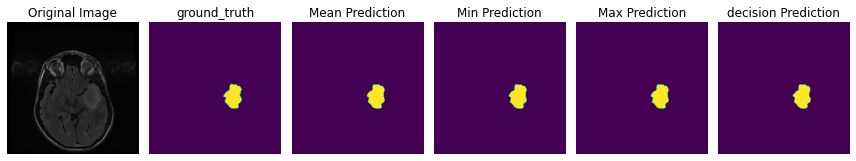

1/1 [==============================] - 1s 979ms/step


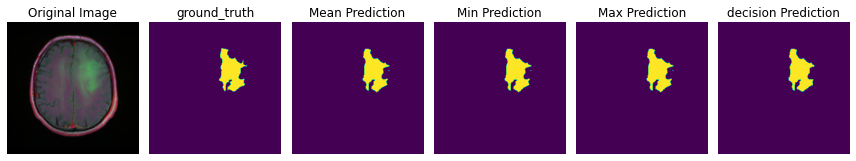

1/1 [==============================] - 1s 778ms/step


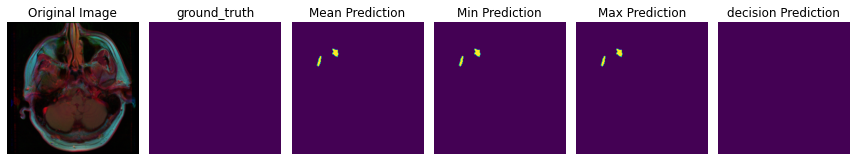

1/1 [==============================] - 1s 800ms/step


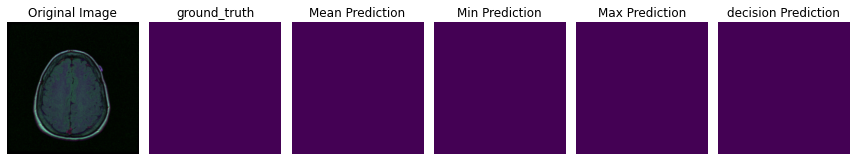

1/1 [==============================] - 1s 967ms/step


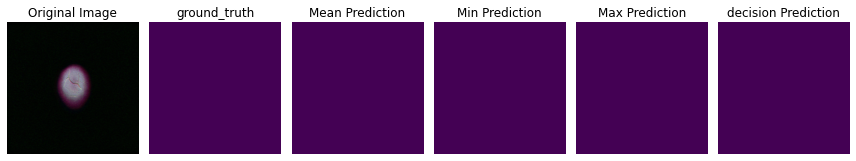

1/1 [==============================] - 1s 777ms/step


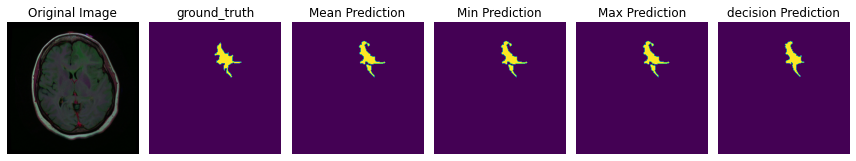

1/1 [==============================] - 1s 854ms/step


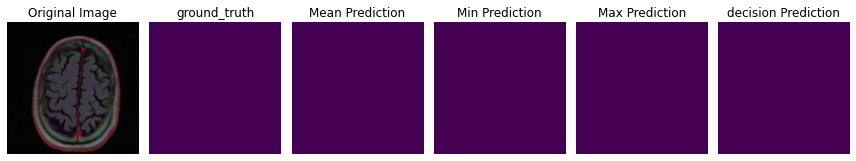

1/1 [==============================] - 1s 1s/step


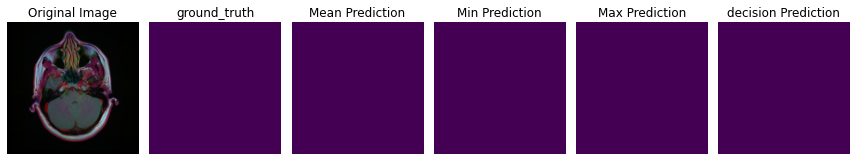

1/1 [==============================] - 1s 979ms/step


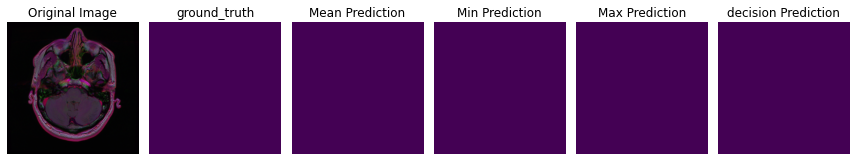

1/1 [==============================] - 1s 756ms/step


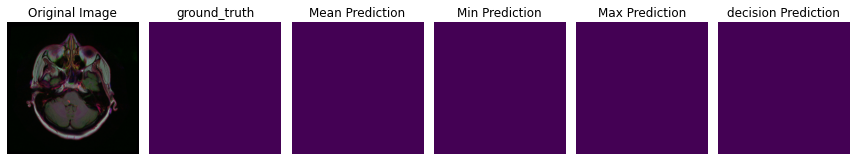

1/1 [==============================] - 1s 1s/step


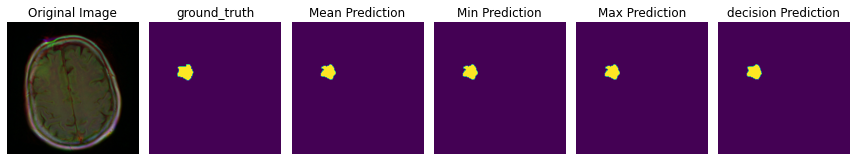

1/1 [==============================] - 1s 785ms/step


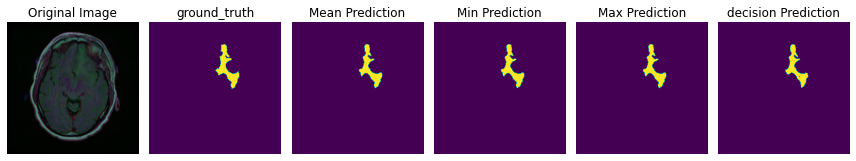

1/1 [==============================] - 1s 773ms/step


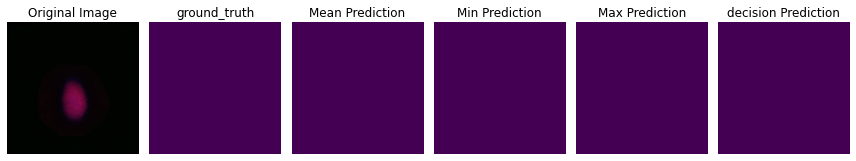

1/1 [==============================] - 1s 763ms/step


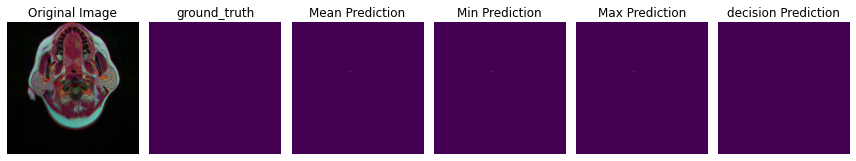

1/1 [==============================] - 1s 757ms/step


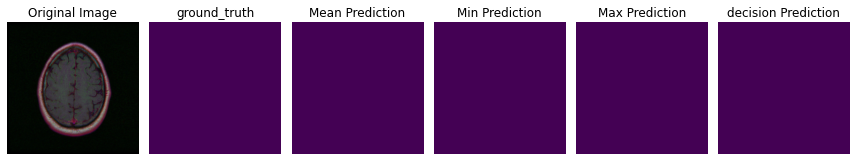

1/1 [==============================] - 1s 739ms/step


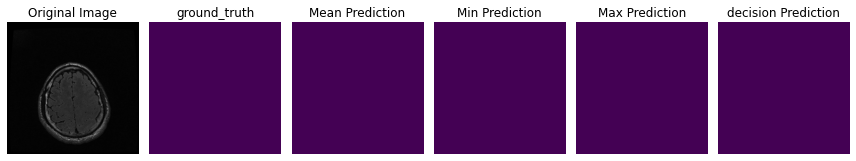

1/1 [==============================] - 1s 860ms/step


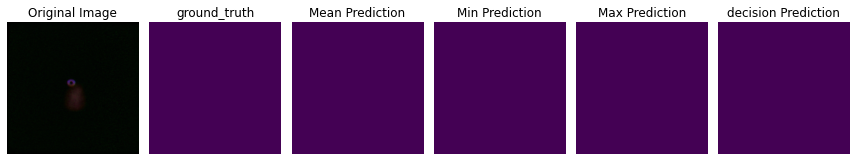

1/1 [==============================] - 1s 774ms/step


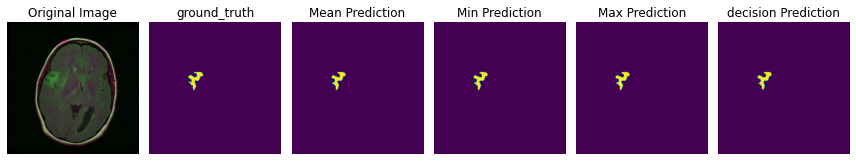

1/1 [==============================] - 1s 867ms/step


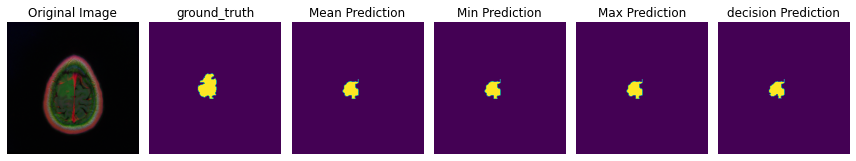

1/1 [==============================] - 1s 756ms/step


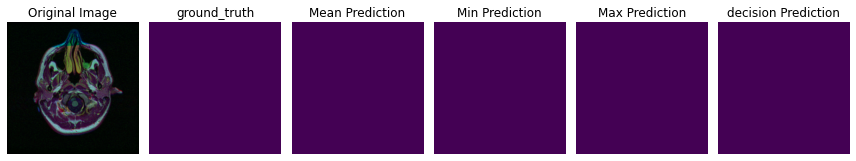

1/1 [==============================] - 1s 844ms/step


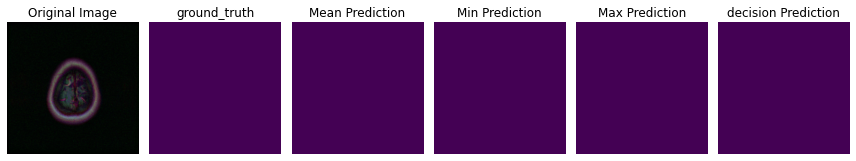

1/1 [==============================] - 1s 799ms/step


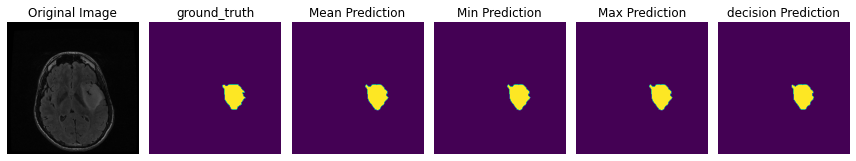

1/1 [==============================] - 1s 809ms/step


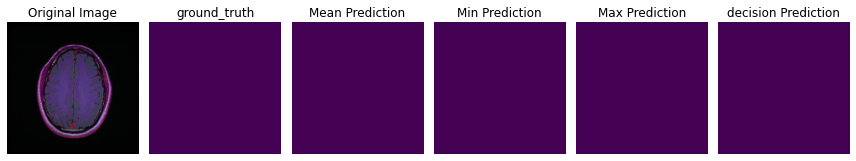

1/1 [==============================] - 1s 804ms/step


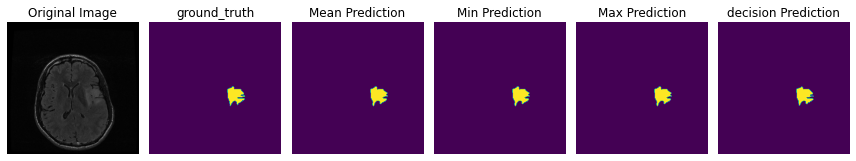

1/1 [==============================] - 1s 763ms/step


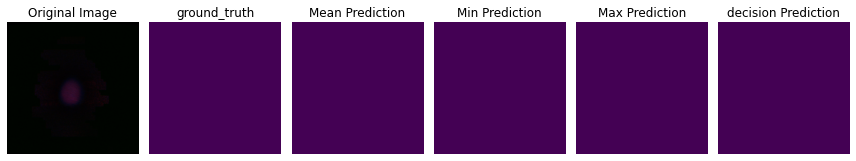

1/1 [==============================] - 1s 746ms/step


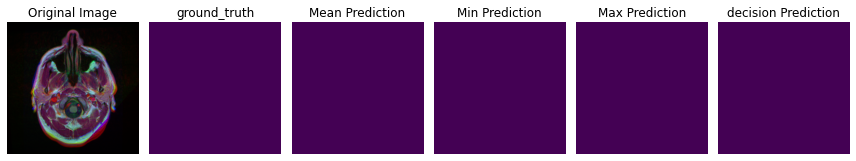

1/1 [==============================] - 1s 778ms/step


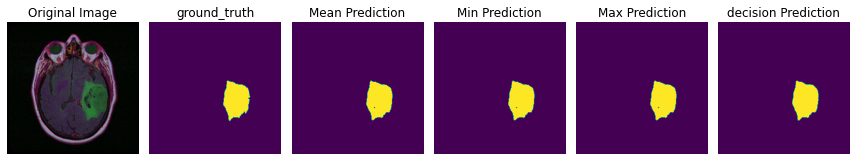

1/1 [==============================] - 1s 1s/step


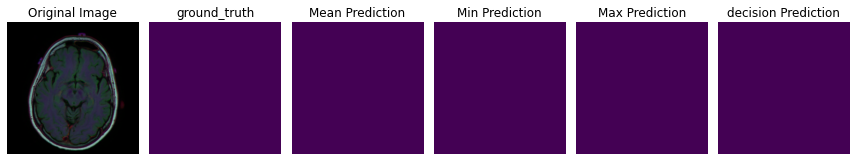

1/1 [==============================] - 1s 877ms/step


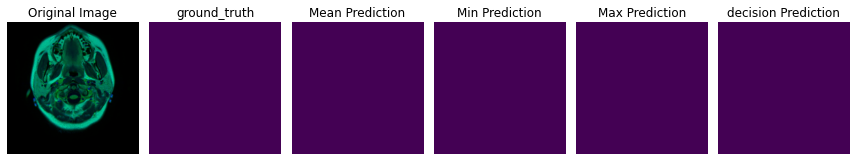

1/1 [==============================] - 1s 936ms/step


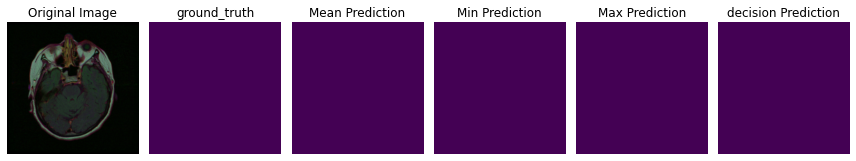

1/1 [==============================] - 1s 966ms/step


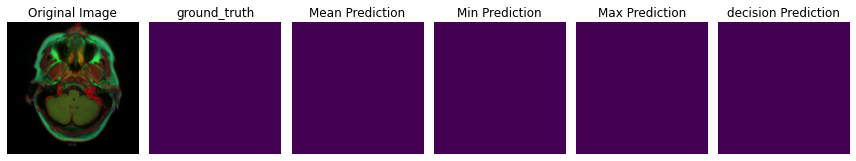

1/1 [==============================] - 1s 878ms/step


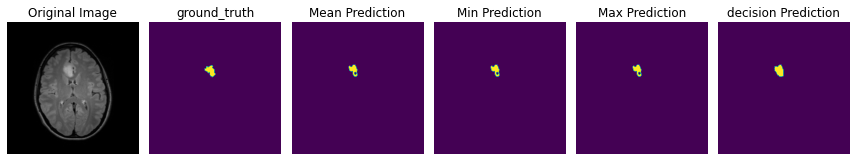

1/1 [==============================] - 1s 804ms/step


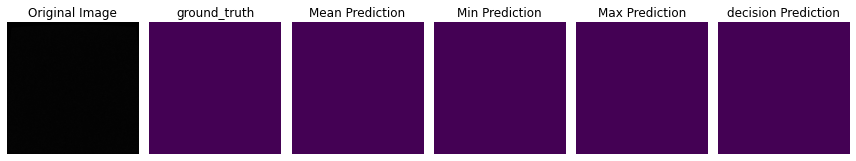

1/1 [==============================] - 1s 829ms/step


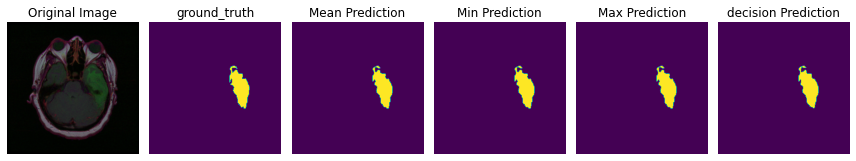

1/1 [==============================] - 1s 766ms/step


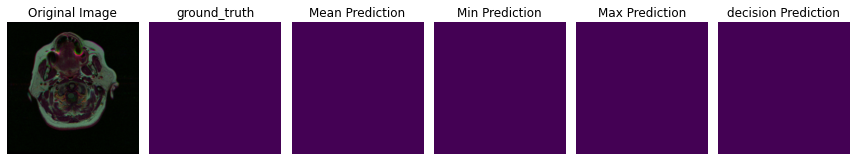

1/1 [==============================] - 1s 800ms/step


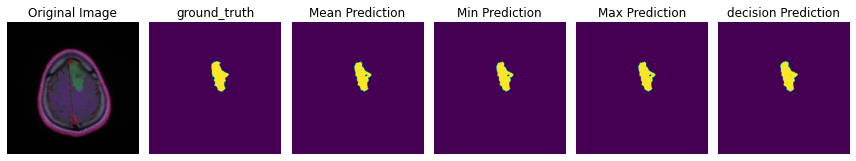

1/1 [==============================] - 1s 835ms/step


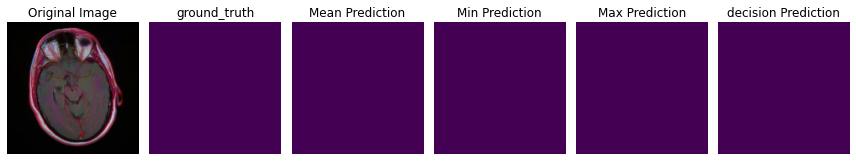

1/1 [==============================] - 1s 960ms/step


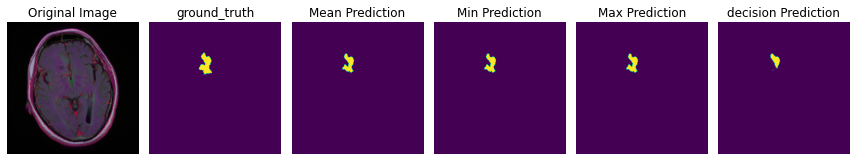

1/1 [==============================] - 1s 980ms/step


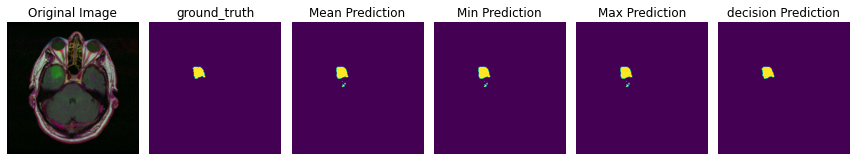

1/1 [==============================] - 1s 1s/step


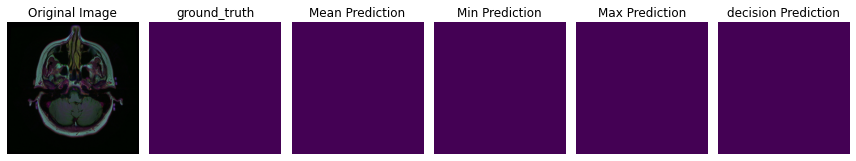

1/1 [==============================] - 1s 990ms/step


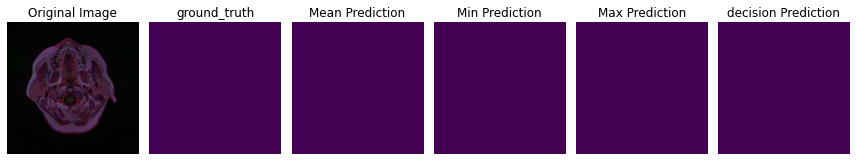

1/1 [==============================] - 1s 1s/step


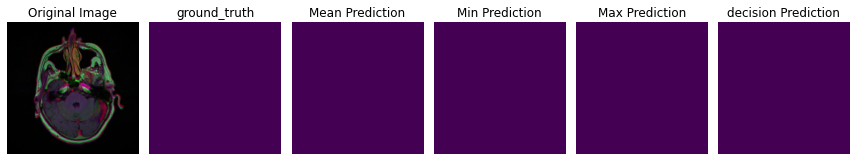

1/1 [==============================] - 1s 1s/step


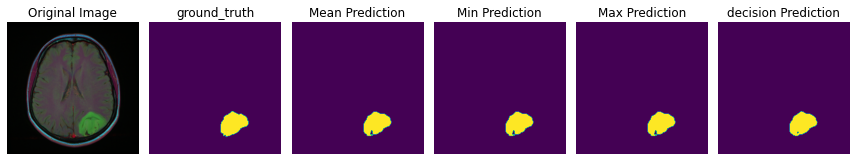

1/1 [==============================] - 1s 921ms/step


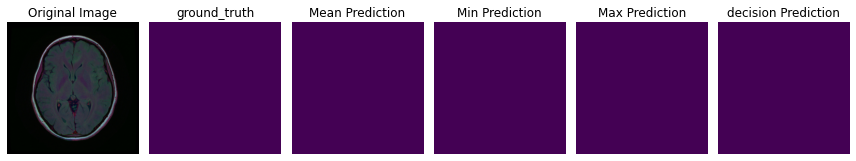

1/1 [==============================] - 1s 1s/step


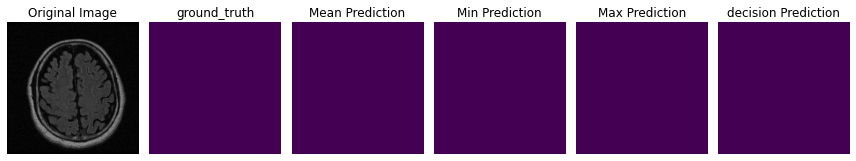

1/1 [==============================] - 1s 905ms/step


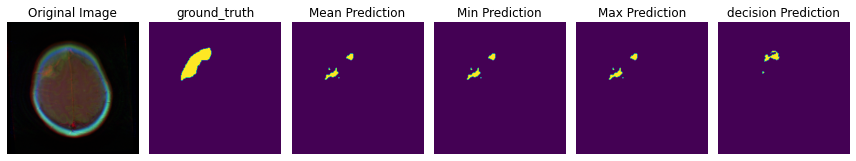

1/1 [==============================] - 1s 824ms/step


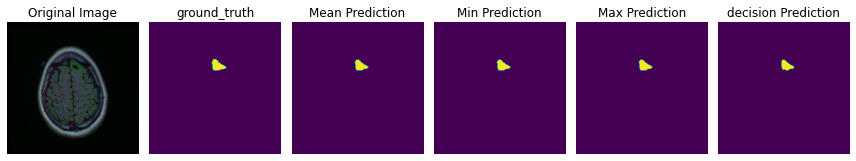

1/1 [==============================] - 1s 872ms/step


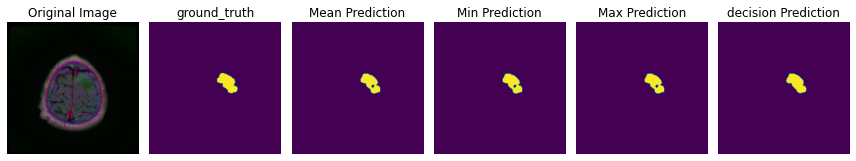

1/1 [==============================] - 1s 1s/step


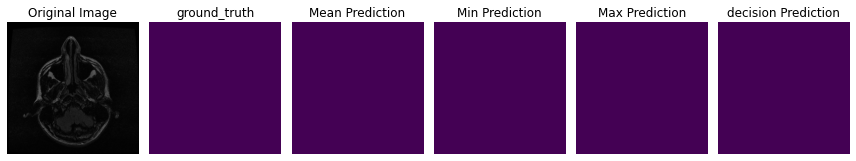

1/1 [==============================] - 1s 1s/step


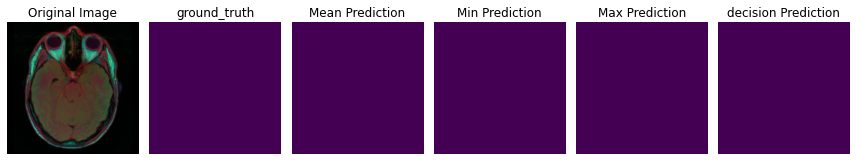

1/1 [==============================] - 1s 1s/step


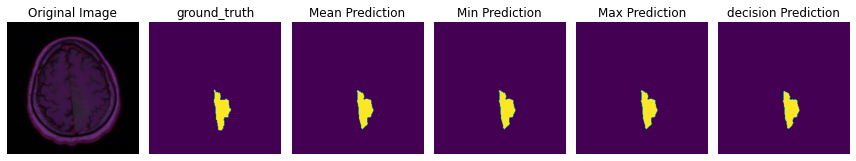

1/1 [==============================] - 1s 952ms/step


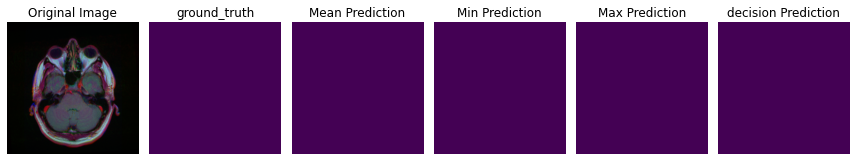

1/1 [==============================] - 1s 1s/step


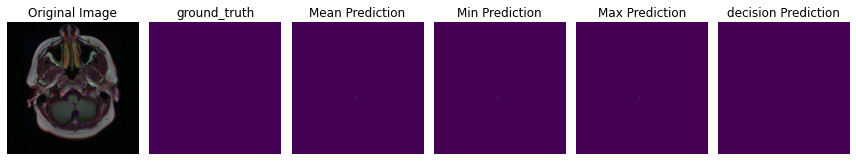

1/1 [==============================] - 1s 872ms/step


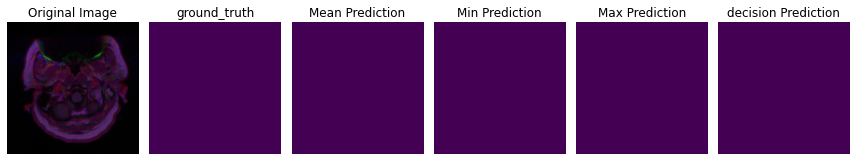

1/1 [==============================] - 1s 869ms/step


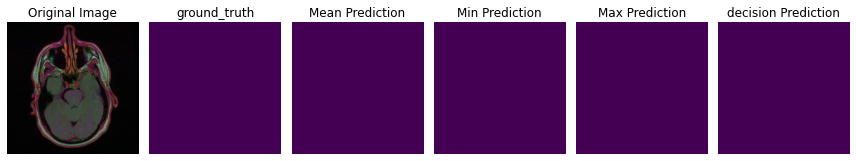

1/1 [==============================] - 1s 1s/step


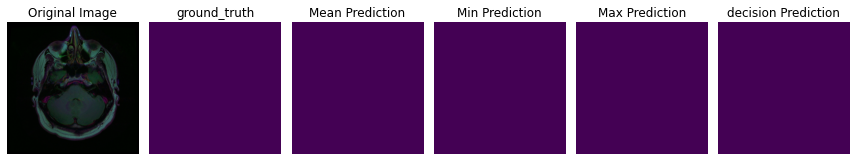

1/1 [==============================] - 1s 1s/step


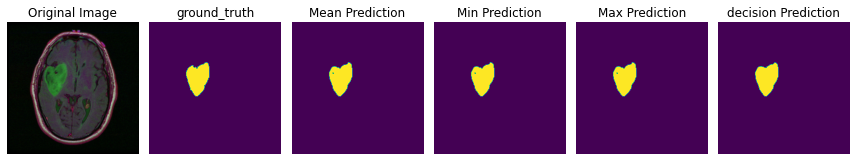

1/1 [==============================] - 1s 931ms/step


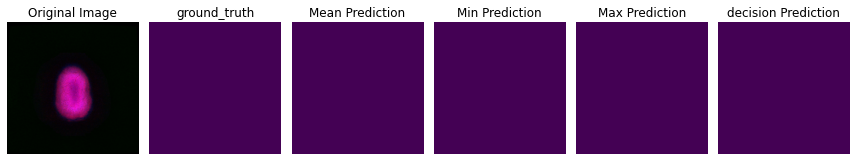

1/1 [==============================] - 1s 963ms/step


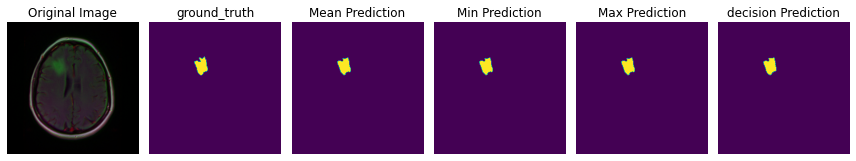

1/1 [==============================] - 1s 967ms/step


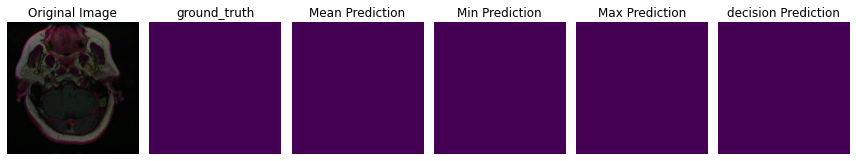

1/1 [==============================] - 1s 1s/step


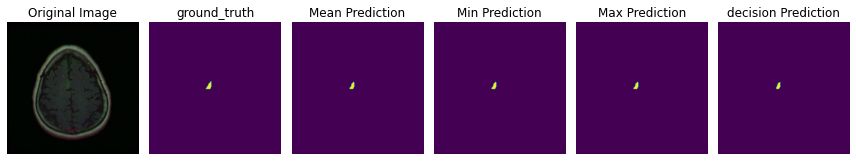

1/1 [==============================] - 1s 933ms/step


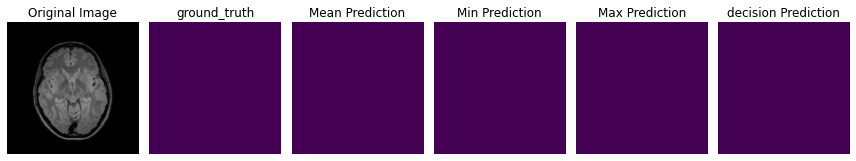

1/1 [==============================] - 1s 1s/step


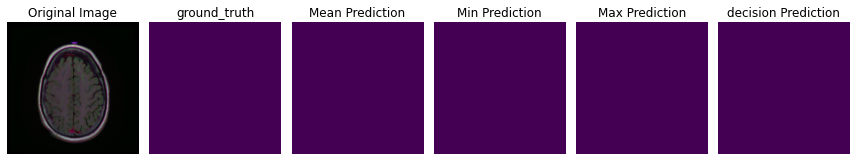

1/1 [==============================] - 1s 1s/step


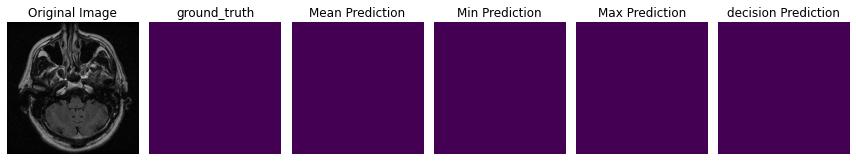

1/1 [==============================] - 1s 979ms/step


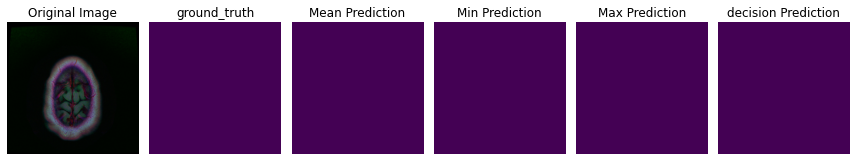

1/1 [==============================] - 1s 1s/step


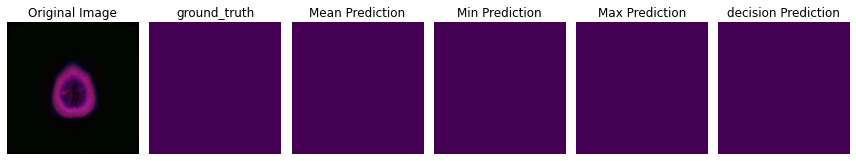

1/1 [==============================] - 1s 847ms/step


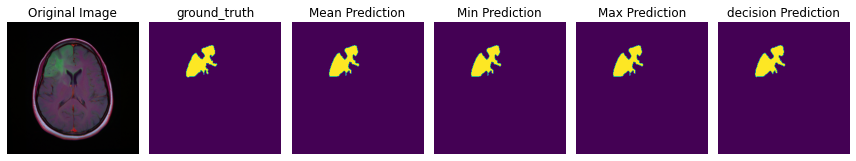

1/1 [==============================] - 1s 910ms/step


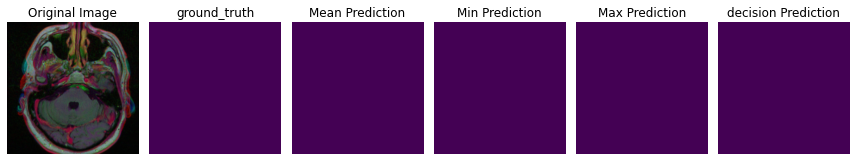

1/1 [==============================] - 1s 897ms/step


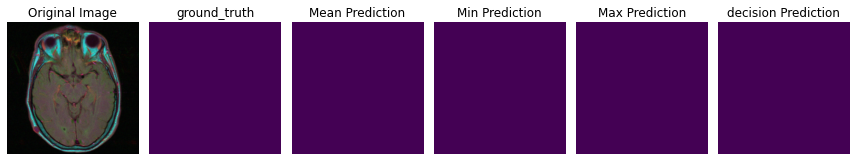

1/1 [==============================] - 1s 1s/step


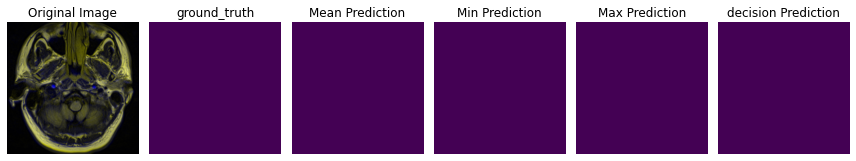

1/1 [==============================] - 1s 1s/step


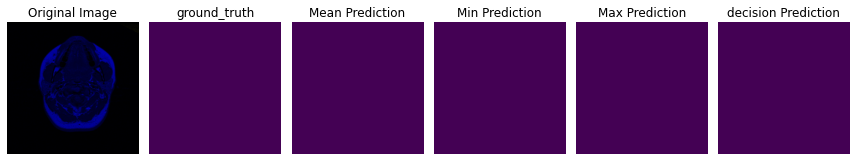

1/1 [==============================] - 1s 879ms/step


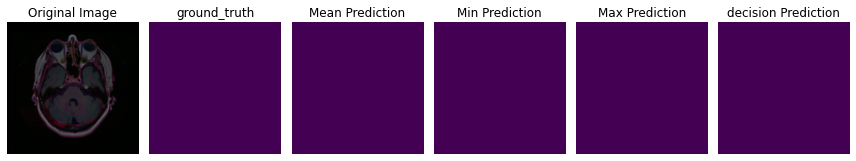

1/1 [==============================] - 1s 860ms/step


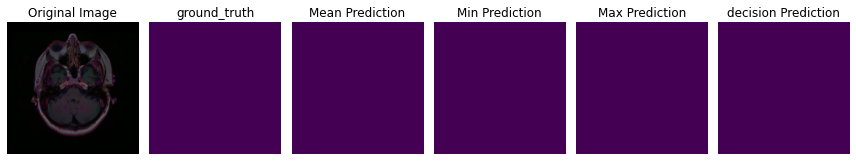

1/1 [==============================] - 1s 900ms/step


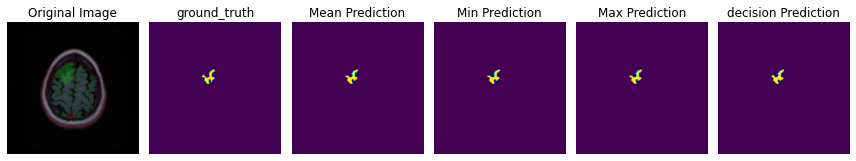

1/1 [==============================] - 1s 852ms/step


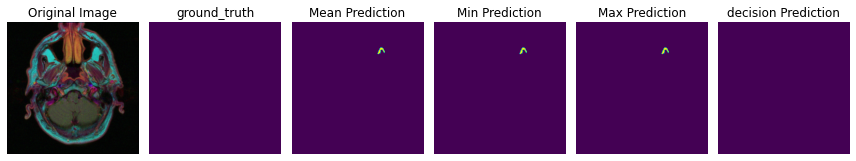

1/1 [==============================] - 1s 1s/step


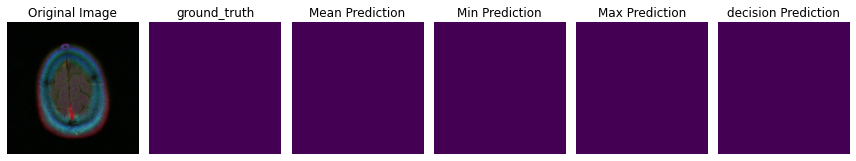

1/1 [==============================] - 1s 836ms/step


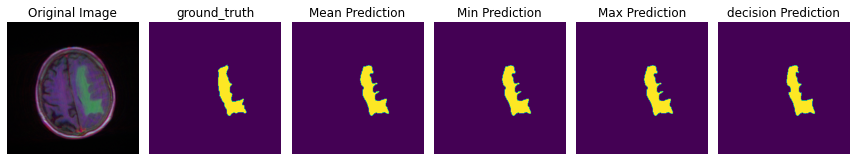

1/1 [==============================] - 2s 2s/step


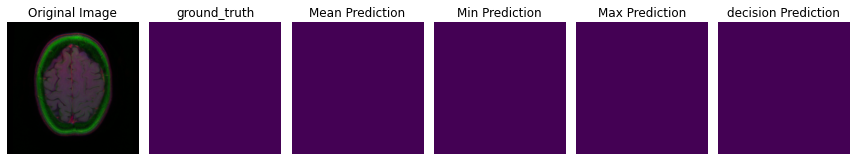

1/1 [==============================] - 1s 943ms/step


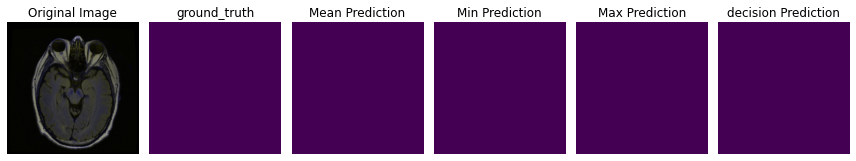

1/1 [==============================] - 1s 837ms/step


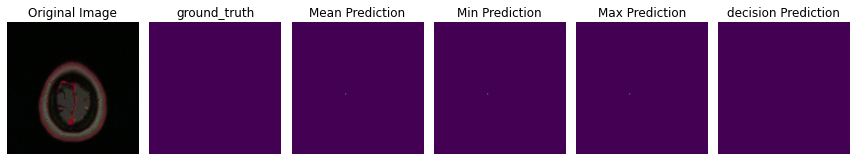

1/1 [==============================] - 1s 1s/step


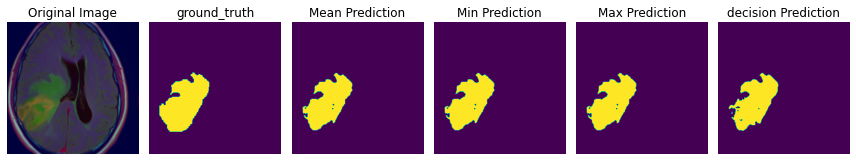

1/1 [==============================] - 1s 975ms/step


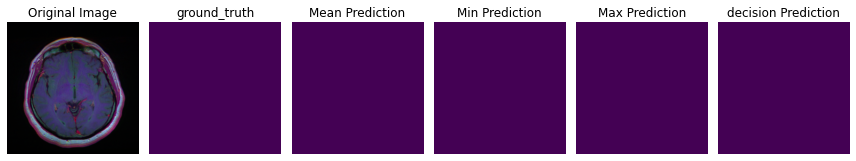

1/1 [==============================] - 1s 1s/step


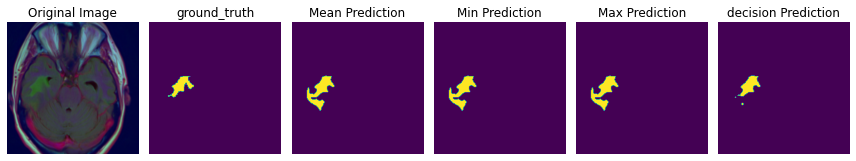

1/1 [==============================] - 1s 957ms/step


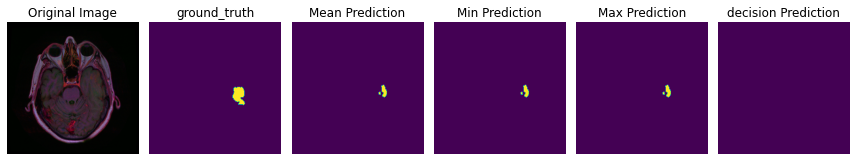

1/1 [==============================] - 1s 930ms/step


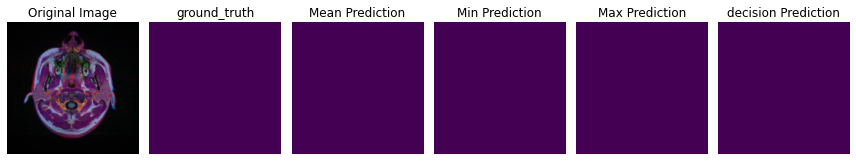

1/1 [==============================] - 1s 1s/step


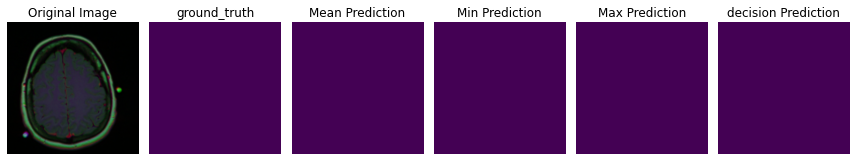

1/1 [==============================] - 1s 1s/step


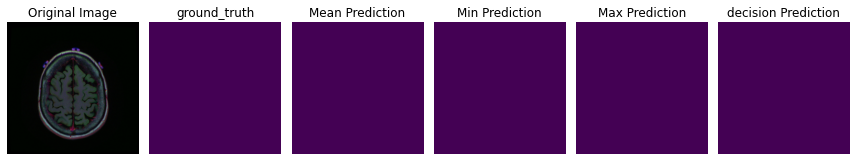

1/1 [==============================] - 1s 1s/step


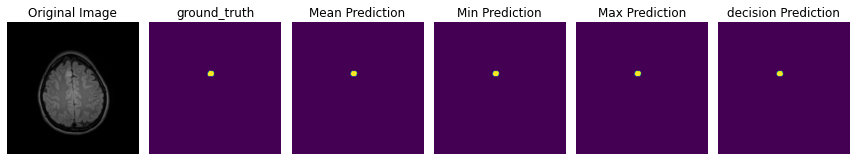

1/1 [==============================] - 1s 944ms/step


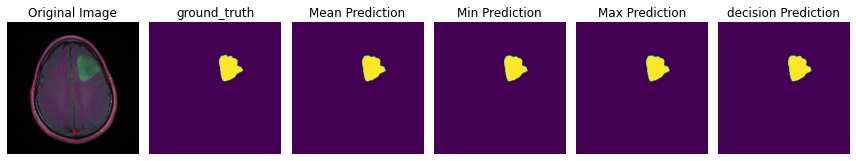

1/1 [==============================] - 1s 1s/step


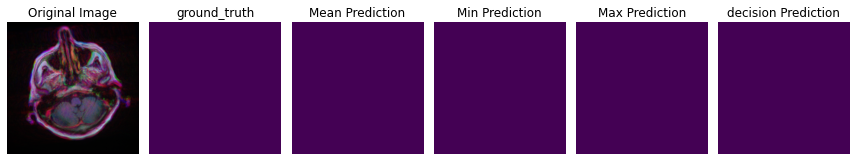

1/1 [==============================] - 1s 900ms/step


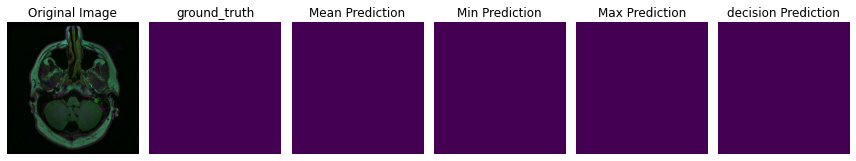

1/1 [==============================] - 1s 797ms/step


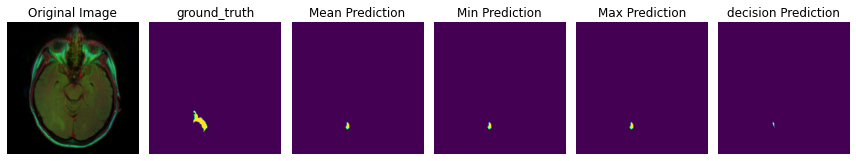

1/1 [==============================] - 1s 1s/step


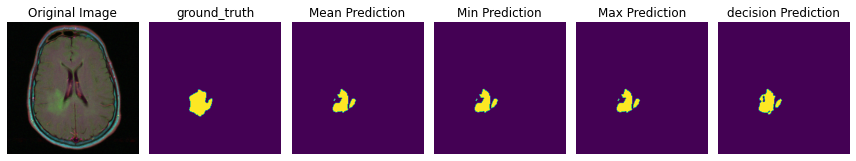

1/1 [==============================] - 1s 887ms/step


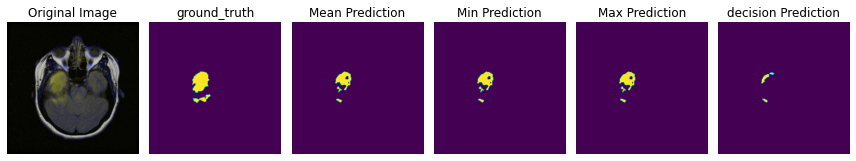

1/1 [==============================] - 1s 846ms/step


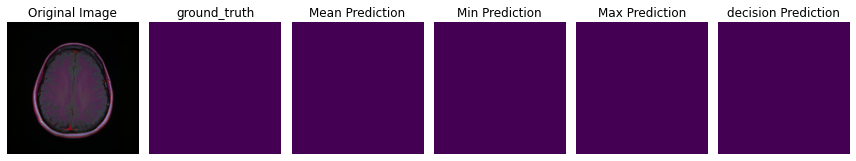

1/1 [==============================] - 1s 850ms/step


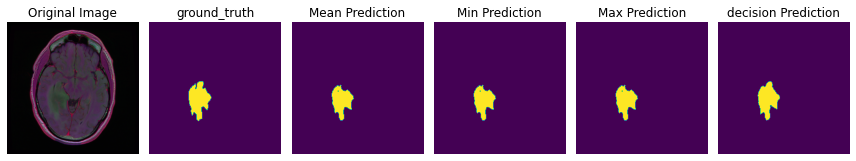

1/1 [==============================] - 1s 999ms/step


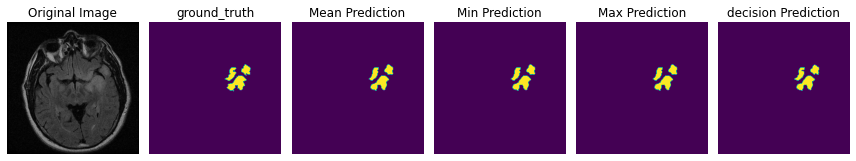

1/1 [==============================] - 1s 801ms/step


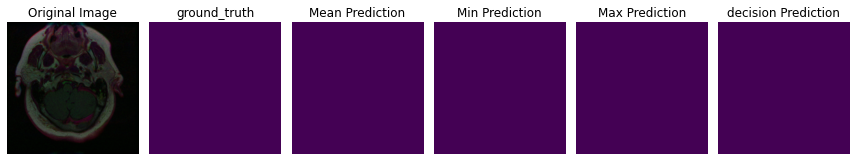

1/1 [==============================] - 1s 789ms/step


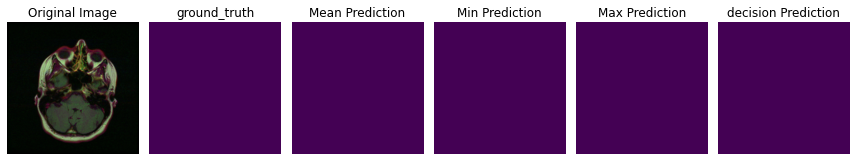

1/1 [==============================] - 1s 1s/step


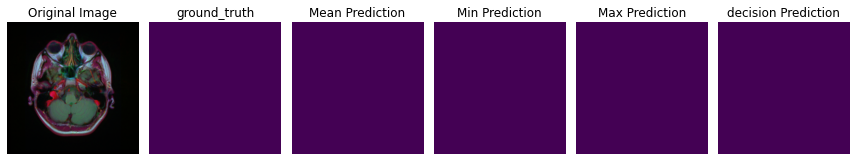

1/1 [==============================] - 1s 990ms/step


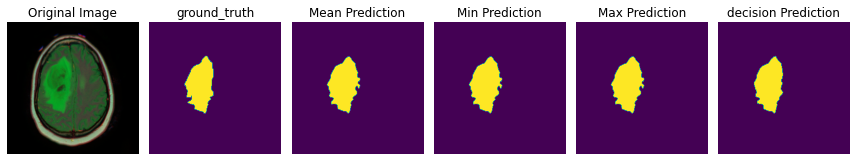

1/1 [==============================] - 1s 945ms/step


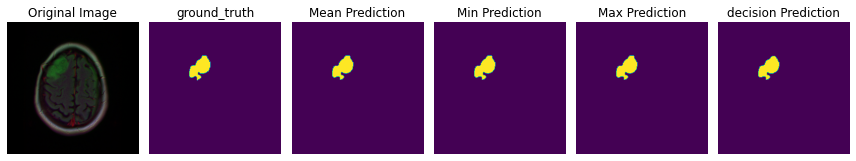

1/1 [==============================] - 1s 1s/step


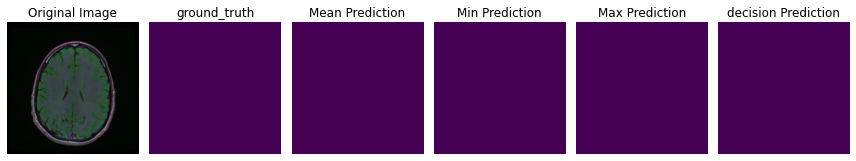

1/1 [==============================] - 1s 1s/step


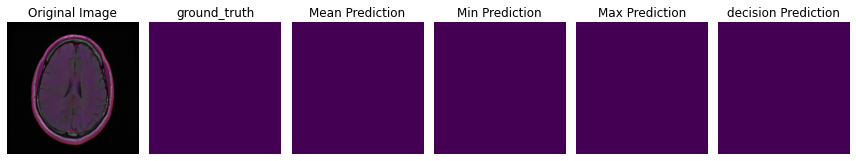

1/1 [==============================] - 1s 937ms/step


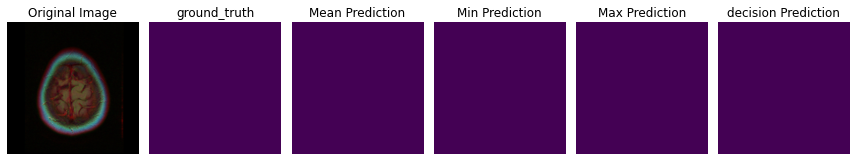

1/1 [==============================] - 1s 1s/step


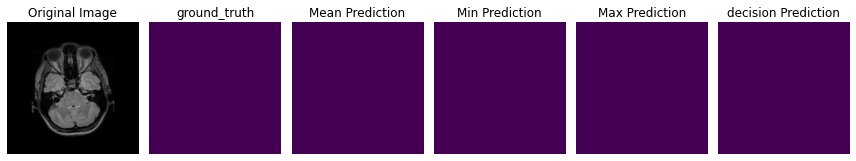

1/1 [==============================] - 1s 1s/step


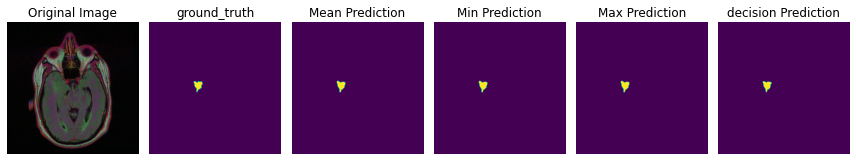

1/1 [==============================] - 1s 1s/step


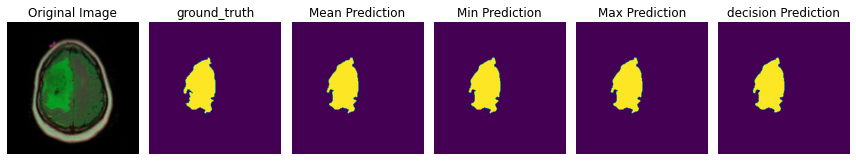

1/1 [==============================] - 1s 943ms/step


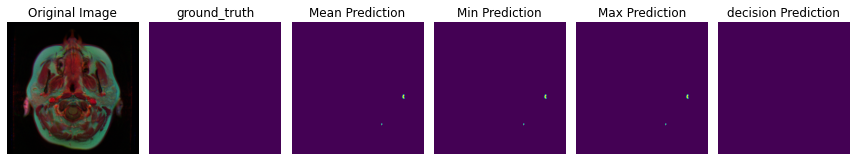

1/1 [==============================] - 1s 1s/step


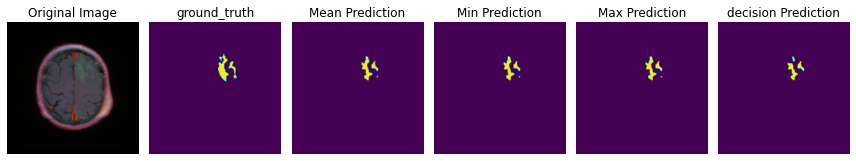

1/1 [==============================] - 1s 863ms/step


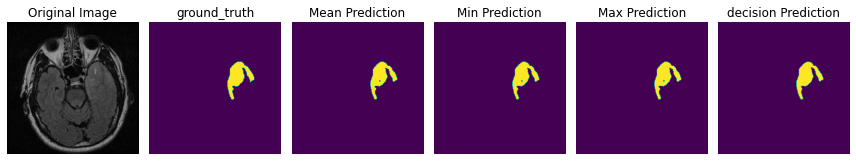

1/1 [==============================] - 1s 897ms/step


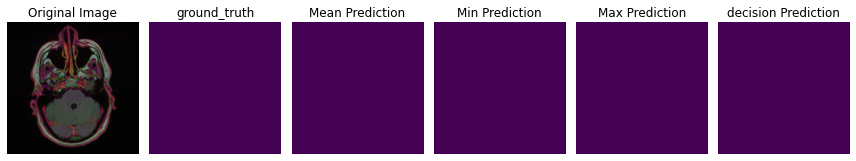

1/1 [==============================] - 1s 1s/step


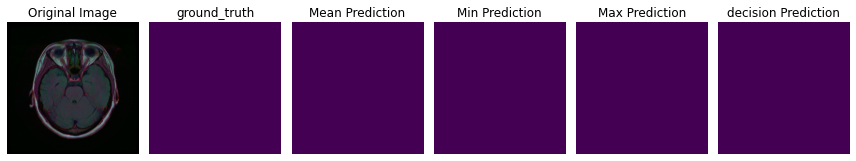

1/1 [==============================] - 1s 821ms/step


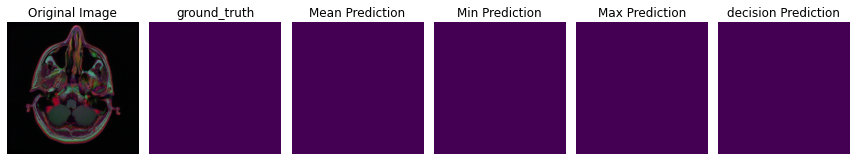

1/1 [==============================] - 1s 1s/step


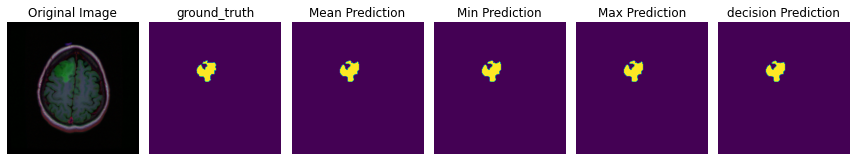

1/1 [==============================] - 1s 1s/step


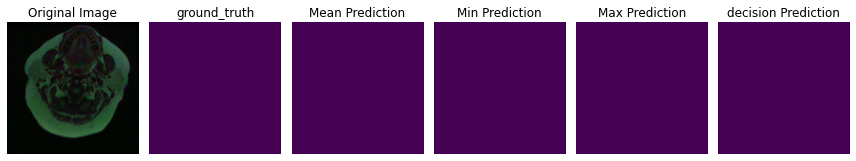

1/1 [==============================] - 1s 1s/step


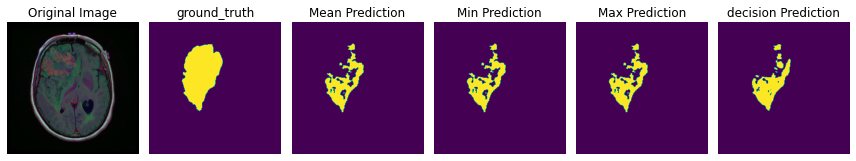

1/1 [==============================] - 1s 960ms/step


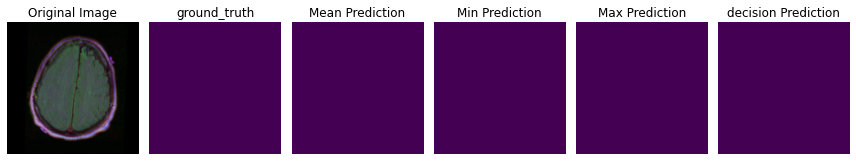

1/1 [==============================] - 1s 909ms/step


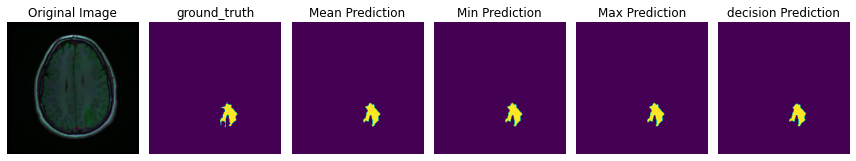

1/1 [==============================] - 1s 854ms/step


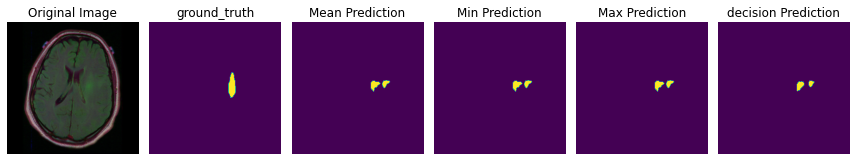

1/1 [==============================] - 1s 1s/step


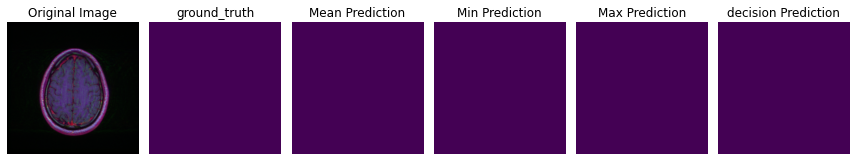

1/1 [==============================] - 1s 991ms/step


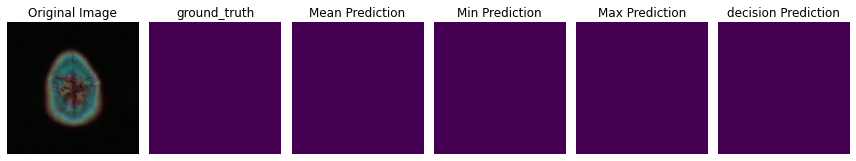

1/1 [==============================] - 1s 1s/step


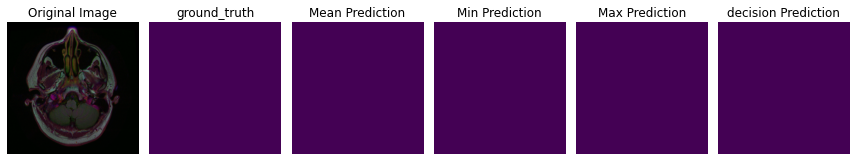

1/1 [==============================] - 1s 821ms/step


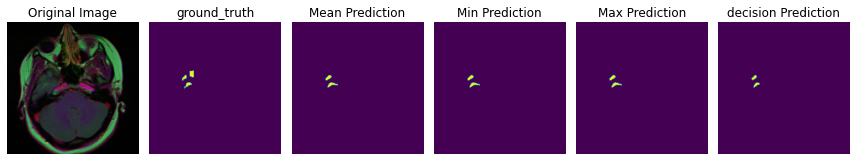

1/1 [==============================] - 1s 1s/step


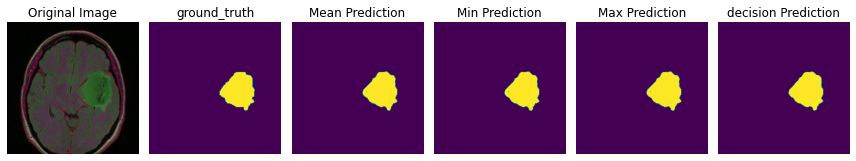

1/1 [==============================] - 1s 1s/step


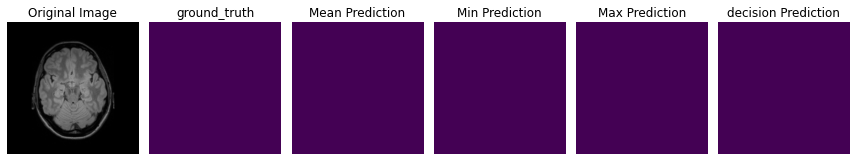

1/1 [==============================] - 1s 1s/step


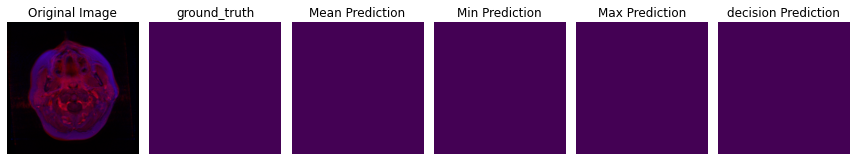

1/1 [==============================] - 1s 1s/step


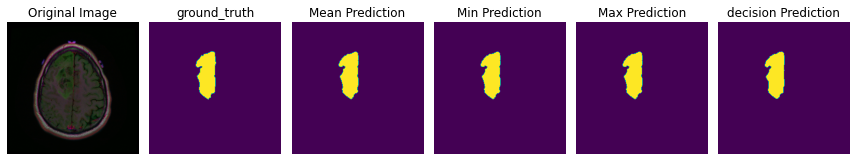

1/1 [==============================] - 1s 936ms/step


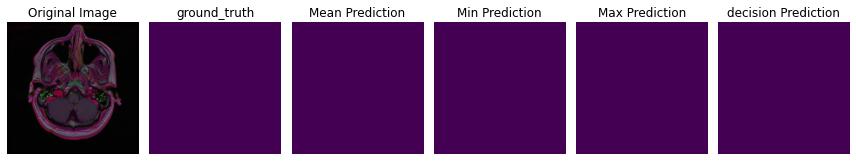

1/1 [==============================] - 1s 836ms/step


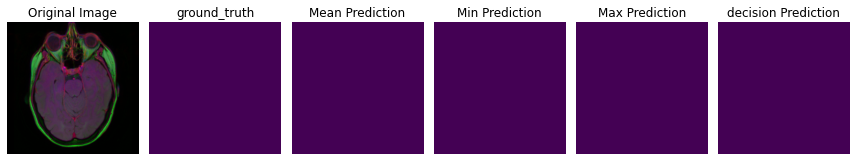

1/1 [==============================] - 1s 949ms/step


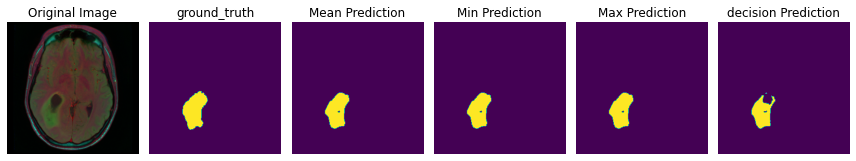

1/1 [==============================] - 1s 828ms/step


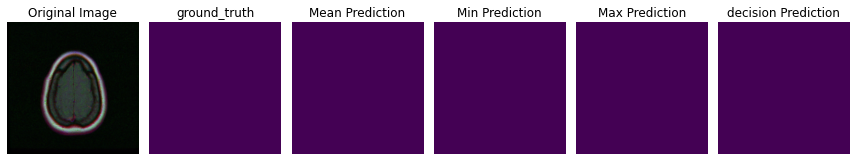

1/1 [==============================] - 1s 764ms/step


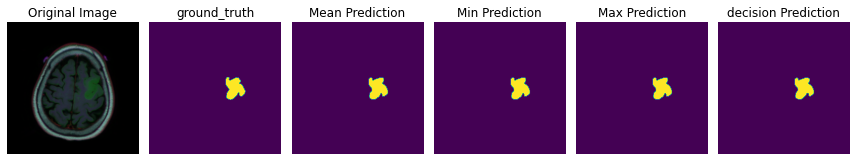

1/1 [==============================] - 1s 824ms/step


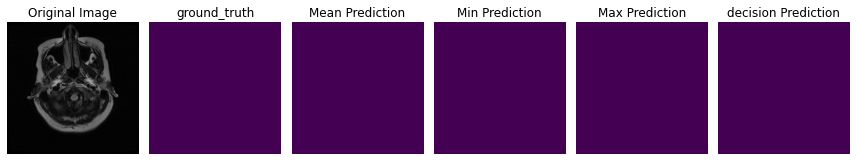

1/1 [==============================] - 1s 854ms/step


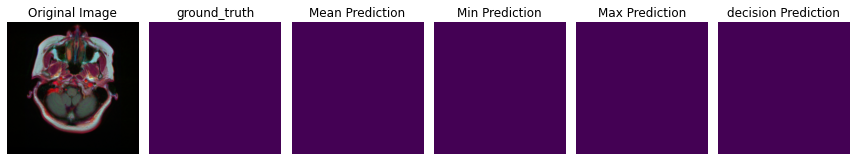

1/1 [==============================] - 1s 826ms/step


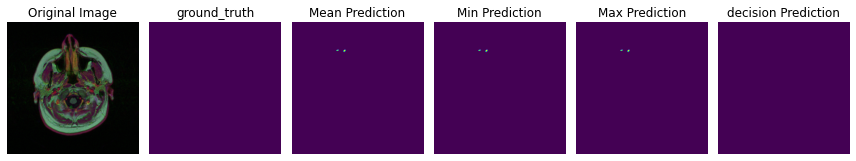

In [ ]:
import numpy as np
import cv2
from scipy.stats import mode
import matplotlib.pyplot as plt

# Create a list of models
models = [model_load1, model_load2, model_load3, model_load4]
DICE_COFF = []
IUO = []
ACCURACY = []

for idx in range(len(testdata.index)):


    ground_truth = cv2.imread(testdata['mask'].iloc[idx])
    ground_truth = np.expand_dims(ground_truth[:, :, 0], axis=(0, -1))
    ground_truth = ground_truth / 255

    # Plot the predictions
    fig, axs = plt.subplots(1, 6, figsize=(12, 3))

    axs[0].imshow(np.squeeze(img))  # Adjusted indexing
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    axs[1].imshow(np.squeeze(ground_truth))  # Adjusted indexing
    axs[1].set_title('ground_truth')
    axs[1].axis('off')


    axs[2].imshow(np.squeeze(mean_prediction))  # Adjusted indexing
    axs[2].set_title('Mean Prediction')
    axs[2].axis('off')

    axs[3].imshow(np.squeeze(min_prediction))  # Adjusted indexing
    axs[3].set_title('Min Prediction')
    axs[3].axis('off')

    axs[4].imshow(np.squeeze(max_prediction))  # Adjusted indexing
    axs[4].set_title('Max Prediction')
    axs[4].axis('off')


    axs[5].imshow(np.squeeze(decision_prediction))  # Adjusted indexing
    axs[5].set_title('decision Prediction')
    axs[5].axis('off')

    plt.tight_layout()
    plt.show()
